<a href="https://colab.research.google.com/github/shirley-mango/Facebook100_network_graph_learning/blob/main/Graphes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Importation des données via Drive

In [ ]:
!pip install gdown
import gdown

In [ ]:
# URL du fichier public sur Drive
file_id = '19NGkaZthBCpSY2PSqjiwWWEFfWCzM2Al'
url = f'https://drive.google.com/uc?export=download&id={file_id}'

# Télécharger le fichier
gdown.download(url, output='fb100.zip', quiet=False)

Downloading...
From (original): https://drive.google.com/uc?export=download&id=19NGkaZthBCpSY2PSqjiwWWEFfWCzM2Al
From (redirected): https://drive.google.com/uc?export=download&id=19NGkaZthBCpSY2PSqjiwWWEFfWCzM2Al&confirm=t&uuid=db151335-bb35-4ac5-91cb-f4c7a15c949a
To: /content/fb100.zip
100%|██████████| 207M/207M [00:04<00:00, 43.6MB/s]


'fb100.zip'

In [ ]:
import zipfile

# Chemin du fichier ZIP
zip_path = '/content/fb100.zip'

# Chemin d'extraction du contenu du fichier ZIP
extract_path = '/content/fb100_extracted/'

# Créer le dossier d'extraction
import os
os.makedirs(extract_path, exist_ok=True)

# Extraire le fichier ZIP
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print(f"Les fichiers ont été extraits dans : {extract_path}")

Les fichiers ont été extraits dans : /content/fb100_extracted/


In [ ]:
# Supprimer le fichier ZIP
os.remove(zip_path)
print("Le fichier ZIP a été supprimé.")

Le fichier ZIP a été supprimé.


In [ ]:
import os

# Spécifie le chemin du répertoire où chercher les fichiers .gml
directory_path = '/content/fb100_extracted/data/'

# Liste de tous les fichiers .gml
gml_files = [f for f in os.listdir(directory_path) if f.endswith('.gml')]

# Afficher les noms des fichiers .gml
print(gml_files)

['Villanova62.gml', 'UVA16.gml', 'FSU53.gml', 'Indiana69.gml', 'Auburn71.gml', 'UCSC68.gml', 'Georgetown15.gml', 'UGA50.gml', 'UC33.gml', 'Colgate88.gml', 'JMU79.gml', 'UCSD34.gml', 'Temple83.gml', 'Carnegie49.gml', 'Dartmouth6.gml', 'UNC28.gml', 'UCLA26.gml', 'Haverford76.gml', 'Santa74.gml', 'MSU24.gml', 'USF51.gml', 'GWU54.gml', 'Berkeley13.gml', 'Syracuse56.gml', 'UC61.gml', 'Oberlin44.gml', 'Tufts18.gml', 'Columbia2.gml', 'UIllinois20.gml', 'American75.gml', 'USC35.gml', 'Bucknell39.gml', 'BU10.gml', 'Brown11.gml', 'Princeton12.gml', 'Harvard1.gml', 'UCF52.gml', 'Simmons81.gml', 'Wesleyan43.gml', 'Northeastern19.gml', 'Cal65.gml', 'Penn94.gml', 'Trinity100.gml', 'Lehigh96.gml', 'Vermont70.gml', 'UCSB37.gml', 'BC17.gml', 'Smith60.gml', 'Hamilton46.gml', 'Tennessee95.gml', 'Vanderbilt48.gml', 'Rochester38.gml', 'Oklahoma97.gml', 'Stanford3.gml', 'Caltech36.gml', 'Wellesley22.gml', 'Bingham82.gml', 'Yale4.gml', 'Brandeis99.gml', 'Wake73.gml', 'Reed98.gml', 'Howard90.gml', 'MIT8.gml',

## Importation des librairies

In [ ]:
!pip install networkx

In [ ]:
import networkx as nx

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from tqdm import tqdm

import torch
import random

import json
import pickle

import heapq

from sklearn.metrics import f1_score

from collections import Counter

from matplotlib import colormaps as cmaps

from networkx.algorithms.community import girvan_newman
import itertools

import seaborn as sns

In [ ]:
# versions des packages utilisés

print(f"NetworkX version : {nx.__version__}")
print(f"Matplotlib version : {plt.matplotlib.__version__}")
print(f"Numpy version : {np.__version__}")
print(f"Pandas version : {pd.__version__}")
print(f"Torch version : {torch.__version__}")
print(f"JSON version : {json.__version__}")
print(f"Seaborn version : {sns.__version__}")

NetworkX version : 3.4.2
Matplotlib version : 3.10.0
Numpy version : 1.26.4
Pandas version : 2.2.2
Torch version : 2.5.1+cu124
JSON version : 2.0.9
Seaborn version : 0.13.2


## Question 2 : Social Network Analysis with the Facebook100 Dataset

In [ ]:
# Rechercher les noms des fichiers des graphes de Caltech, MIT et Johns Hopkins
liste_ecoles = ["Caltech", "MIT", "Johns Hopkins"]

for ecole in liste_ecoles:
  for gml_file in gml_files:
    if ecole in gml_file:
      print(gml_file)

Caltech36.gml
MIT8.gml
Johns Hopkins55.gml


In [ ]:
# Chargement des graphes à partir des fichiers .gml
file_path_Caltech = '/content/fb100_extracted/data/Caltech36.gml'
file_path_MIT = '/content/fb100_extracted/data/MIT8.gml'
file_path_JohnsHopkins = '/content/fb100_extracted/data/Johns Hopkins55.gml'

Caltech = nx.read_gml(file_path_Caltech)
MIT = nx.read_gml(file_path_MIT)
JohnsHopkins = nx.read_gml(file_path_JohnsHopkins)

# Afficher le nombre de noeuds par graphe
print(f"Nombre de noeuds du graphe Caltech : {Caltech.number_of_nodes()}")
print(f"Nombre de noeuds du graphe MIT : {MIT.number_of_nodes()}")
print(f"Nombre de noeuds du graphe Johns Hopkins : {JohnsHopkins.number_of_nodes()}")

Nombre de noeuds du graphe Caltech : 769
Nombre de noeuds du graphe MIT : 6440
Nombre de noeuds du graphe Johns Hopkins : 5180


In [ ]:
# on crée des listes qui contiennent l'ensemble des degrés de chaque noeud
degree_caltech = [degree for node, degree in Caltech.degree()]
degree_mit = [degree for node, degree in MIT.degree()]
degree_johnshopkins = [degree for node, degree in JohnsHopkins.degree()]

# on regarde le degré maximum (pour mettre la même échelle sur l'axe des abscisses des 3 plots)
valeur_max = max(max(degree_caltech), max(degree_mit), max(degree_johnshopkins))
print(f"Le degré maximum d'un noeud parmi les 3 graphes est : {valeur_max}")

liste = [degree_caltech, degree_mit, degree_johnshopkins]

# on affiche les distributions des degrés sous forme d'un histogramme pour chaque graphe
for ecole, couleur, nom_ecole in zip(liste, ['sandybrown', 'lightgreen', 'skyblue'], liste_ecoles):
  plt.hist(ecole, color=couleur, edgecolor='black')
  plt.title(f'Distribution des degrés des noeuds pour le graphe de {nom_ecole}')
  plt.xlim(0, valeur_max)
  plt.xlabel('Degré')
  plt.ylabel('Fréquence')
  plt.grid(True)
  plt.show()

del liste

In [ ]:
# calcul des coefficients de clustering globaux

for network, ecole in zip([Caltech, MIT, JohnsHopkins], liste_ecoles):
  clustering_coefficient = nx.transitivity(network)
  print(f"Le coefficient de clustering global du graphe de {ecole} est : {np.round(clustering_coefficient,4)}")

# calcul des coefficients de clustering locaux moyens
print("\n")
for network, ecole in zip([Caltech, MIT, JohnsHopkins], liste_ecoles):
  clustering_coefficient = nx.average_clustering(network)
  print(f"Le coefficient de clustering local moyen du graphe de {ecole} est : {np.round(clustering_coefficient,4)}")

In [ ]:
# calcul de edge density
for network, ecole in zip([Caltech, MIT, JohnsHopkins], liste_ecoles):
  edge_density = nx.density(network)
  print(f"La densité du sous-graphe de {ecole} est : {np.round(edge_density,4)}")

In [ ]:
# afficher les nuages de points des degrés vs les coefficients de clustering locaux

for network, ecole, couleur in zip([Caltech, MIT, JohnsHopkins], liste_ecoles, ['sandybrown', 'lightgreen', 'skyblue']):
  degree_list = [degree for node, degree in network.degree()]
  clustering_local = list(nx.clustering(network).values())
  plt.scatter(degree_list, clustering_local, color=couleur, alpha=0.5)
  plt.title(f'Nuage de points des degrés vs coefficients de clustering locaux pour le graphe {ecole}')
  plt.xlim(0, valeur_max+10)
  plt.xlabel('Degré')
  plt.ylabel('Coefficient de clustering local')
  plt.grid(True)
  plt.show()

## Question 3 : Assortativity Analysis with the Facebook100 Dataset



In [ ]:
# on affiche les attributs des sommets
Caltech.nodes(data=True)['0']

{'student_fac': 1,
 'gender': 1,
 'major_index': 199,
 'second_major': 0,
 'dorm': 169,
 'year': 2008,
 'high_school': 3387}

In [ ]:
# on initialise le dictionnaire qui contiendra les assortativities et on crée une clé pour chaque attribut
assortativities = {}
for attribut in ['student_fac', 'major_index', 'vertex_degree', 'dorm', 'gender']:
  assortativities[attribut] = []
# on initialise la liste qui contiendra la taille des noeuds de chaque network
network_sizes = []

# on parcourt l'ensemble des networks pour calculer les assortativity par attribut
# on remplit en même temps la liste network_sizes
# (on parcourt 1 seule fois l'ensemble des networks pour tout calculer car coûteux de charger les gros graphes)
for network in tqdm(gml_files):
  file_path = f'/content/fb100_extracted/data/{network}'
  graphe = nx.read_gml(file_path)
  network_sizes.append(graphe.number_of_nodes())
  for attribut in ['student_fac', 'major_index', 'vertex_degree', 'dorm', 'gender']:
    if attribut == 'vertex_degree':
      assortativities[attribut].append(nx.degree_assortativity_coefficient(graphe))
    else:
      assortativities[attribut].append(nx.attribute_assortativity_coefficient(graphe, attribute=attribut))


100%|██████████| 100/100 [1:01:16<00:00, 36.77s/it]


In [ ]:
# enregistrer les résultats au format .json
with open("/content/assortativities.json", "w") as f:
    json.dump(assortativities, f)

with open("/content/network_sizes.json", "w") as f:
    json.dump(network_sizes, f)

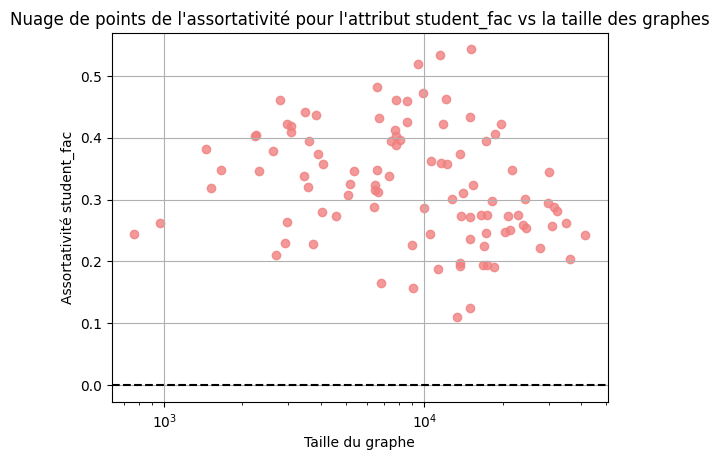

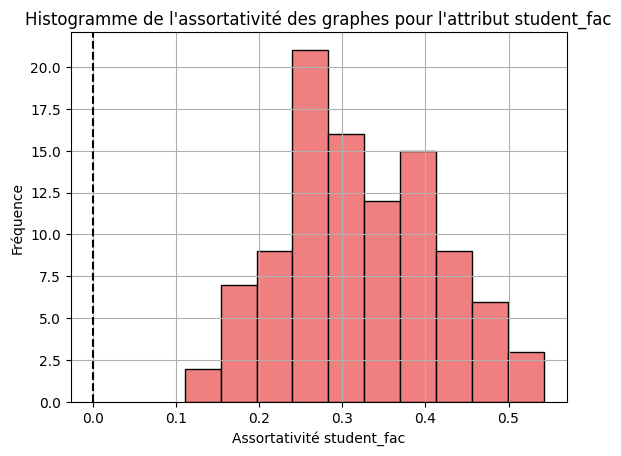

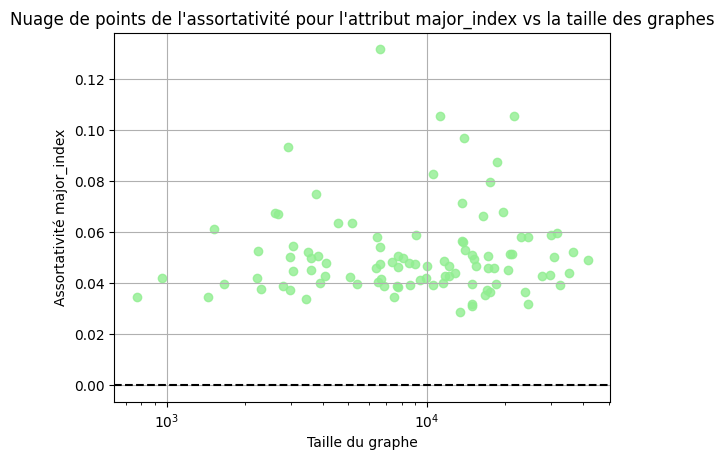

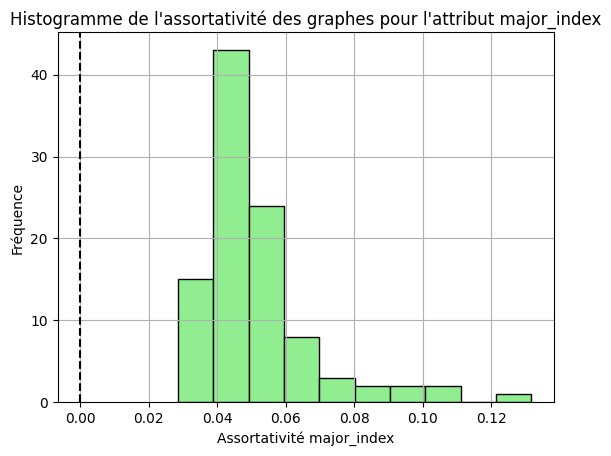

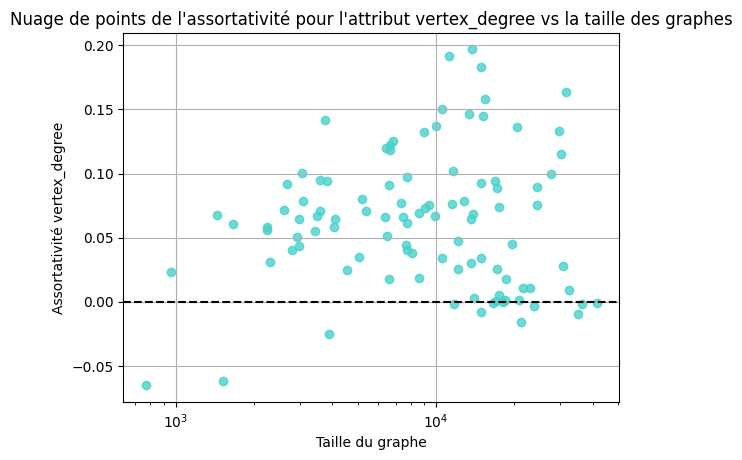

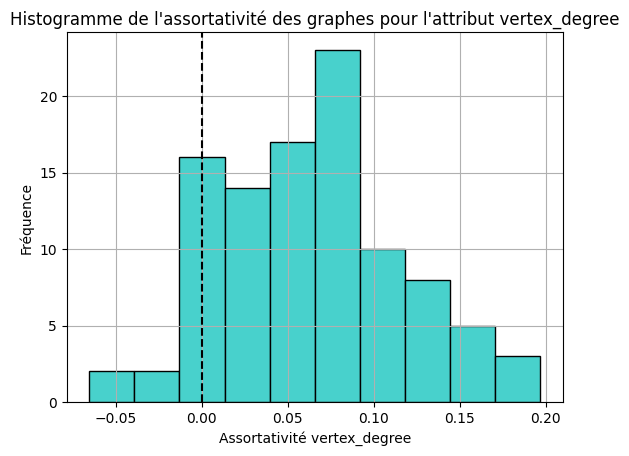

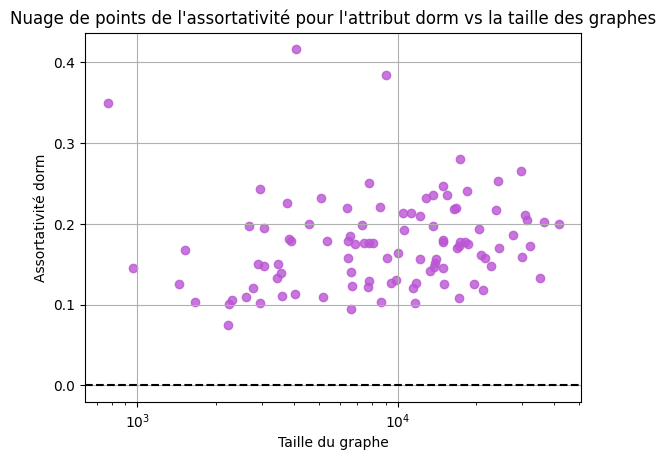

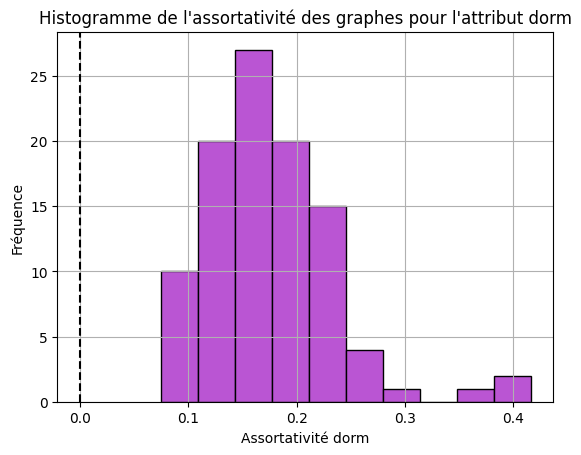

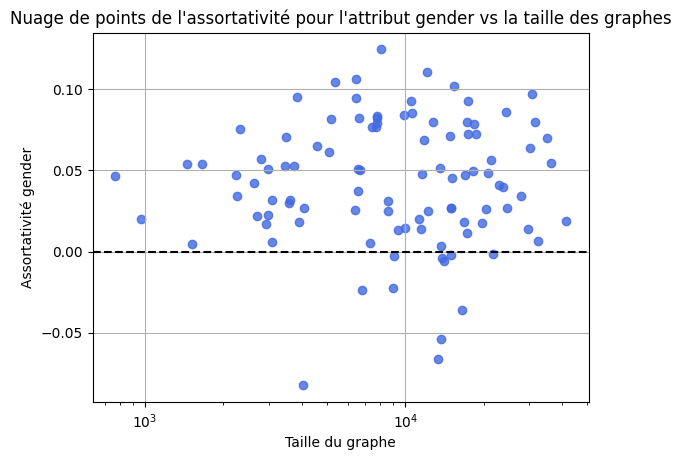

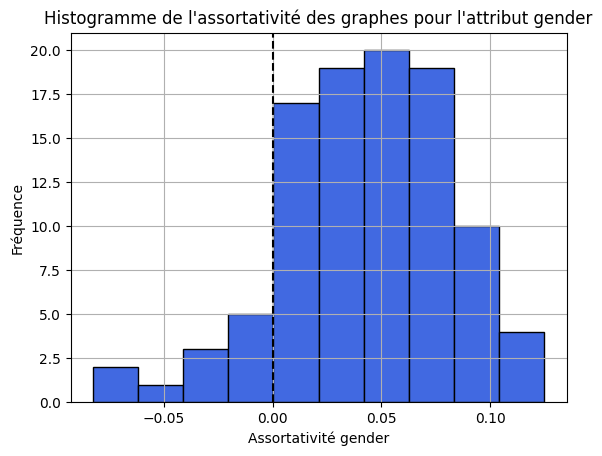

In [ ]:
# tracer les scatter plot et les histogrammes des assortativity pour chacun des attributs
for attribut, couleur in zip(['student_fac', 'major_index', 'vertex_degree', 'dorm', 'gender'], ['lightcoral','lightgreen','mediumturquoise', 'mediumorchid', 'royalblue']):
  # on affiche le nuage de points assortativity vs taille du graphe
  plt.scatter(network_sizes, assortativities[attribut], color=couleur, alpha=0.8)
  # on ajoute une ligne en pointillé indiquant une assortativité nulle
  plt.axhline(y=0, color='black', linestyle='--')
  plt.title(f'Nuage de points de l\'assortativité pour l\'attribut {attribut} vs la taille des graphes')
  plt.xlabel('Taille du graphe')
  plt.xscale('log')
  plt.ylabel(f'Assortativité {attribut}')
  plt.grid(True)
  plt.show()

  # on affiche la distribution des assortativity
  plt.hist(assortativities[attribut], color=couleur, edgecolor='black')
  # on ajoute une ligne en pointillé indiquant une assortativité nulle
  plt.axvline(x=0, color='black', linestyle='--')
  plt.title(f'Histogramme de l\'assortativité des graphes pour l\'attribut {attribut}')
  plt.xlabel(f'Assortativité {attribut}')
  plt.ylabel('Fréquence')
  plt.grid(True)
  plt.show()

In [ ]:
# lire les fichiers au format .json
with open("/content/assortativities.json", "r") as f:
    assortativities = json.load(f)

with open("/content/network_sizes.json", "r") as f:
    network_sizes = json.load(f)

In [ ]:
# afficher les moyennes des assortativités par individu
for attribut in ['student_fac', 'major_index', 'vertex_degree', 'dorm', 'gender']:
  print(f"Pour l'attribut {attribut}, la moyenne de l'assortativité est : {np.round(np.mean(assortativities[attribut]),3)}")

Pour l'attribut student_fac, la moyenne de l'assortativité est : 0.323
Pour l'attribut major_index, la moyenne de l'assortativité est : 0.051
Pour l'attribut vertex_degree, la moyenne de l'assortativité est : 0.063
Pour l'attribut dorm, la moyenne de l'assortativité est : 0.175
Pour l'attribut gender, la moyenne de l'assortativité est : 0.043


## Question 4 : Link Prediction

In [ ]:
from abc import ABC, abstractmethod
import networkx as nx
import numpy as np
from progressbar import progressbar

# implémentation de 3 métriques pour la prédiction de liens : common neighbors, jaccard et Adamic/Adar

class LinkPrediction(ABC):
    def __init__(self, graph):
        """
        Constructor

        Parameters
        ----------
        graph: Networkx graph
        """
        self.graph = graph
        self.N = len(graph)

    def neighbors(self, v):
        """
        Return the neighbors list of a node

        Parameters
        ----------
        v: int
            node id

        Return
        ------
        neighbors_list: python list
        """
        neighbors_list = self.graph.neighbors(v)
        return list(neighbors_list)

    # abstractmethod signifie que la méthode fit doit être implémentée pour chacune des classes qui héritent de la classe LinkPrediction
    @abstractmethod
    def fit(self):
        raise NotImplementedError("Fit must be implemented")

    # la fonction not_connected permettra de déterminer si les 2 noeuds sont connectés ou non
    # car la prédiction de liens concerne les noeuds qui ne sont pas connectés
    def not_connected(self, u, v):
        """
        Vérification si 2 noeuds ne sont pas connectés

        Parameters
        ----------
        u: int
            node id
        v: int
            node id

        Return
        ------
        booleen : bool
        """
        return not self.graph.has_edge(u, v)

class CommonNeighbors(LinkPrediction):
    def __init__(self, graph):
        super(CommonNeighbors, self).__init__(graph)

    def fit(self):
      """
        fit
        Parameters
        ----------
        u: int
            node id
        v: int
            node id

        Return
        ------
        Au lieu de renvoyer toute la liste des prédictions de liens

        Yield permet d'accéder aux prédictions de liens sous forme de tuples (u, v, prediction) en itérant sur le résultat généré par la méthode fit
        """
      nodes = list(self.graph.nodes())
      for i, u in enumerate(progressbar(nodes)):
          for v in nodes[i + 1:]:  # car graphes non orientés, on ne calcule pas 2 fois la prédiction pour 2 sommets reliés
              if self.not_connected(u, v):
                  neighbors_u = self.neighbors(u)
                  neighbors_v = self.neighbors(v)
                  # Calcul du nombre de voisins communs
                  pred = len(set(neighbors_u).intersection(neighbors_v))
                  # yield permet une gestion plus efficace de la mémoire : on accède aux résultats en itérant
                  yield u, v, pred


class JaccardCoefficient(LinkPrediction):
    def __init__(self, graph):
        super(JaccardCoefficient, self).__init__(graph)

    def fit(self):
      """
        fit
        Parameters
        ----------
        u: int
            node id
        v: int
            node id

        Return
        ------
        Au lieu de renvoyer toute la liste des prédictions de liens

        Yield permet d'accéder aux prédictions de liens sous forme de tuples (u, v, prediction) en itérant sur le résultat généré par la méthode fit
        """
      nodes = list(self.graph.nodes())
      for i, u in enumerate(progressbar(nodes)):
          for v in nodes[i + 1:]: # car graphes non orientés, on ne calcule pas 2 fois la prédiction pour 2 sommets reliés
              if self.not_connected(u, v):
                  neighbors_u = self.neighbors(u)
                  neighbors_v = self.neighbors(v)
                  intersection = len(set(neighbors_u).intersection(neighbors_v))
                  union = len(set(neighbors_u).union(neighbors_v))
                  # Calcul du coefficient de Jaccard
                  pred = intersection / union if union != 0 else 0
                  # yield permet une gestion plus efficace de la mémoire : on accède aux résultats en itérant
                  yield u, v, pred

class AdamicAdar(LinkPrediction):
    def __init__(self, graph):
        super(AdamicAdar, self).__init__(graph)

    def fit(self):
      """
        fit
        Parameters
        ----------
        u: int
            node id
        v: int
            node id

        Return
        ------
        Au lieu de renvoyer toute la liste des prédictions de liens

        Yield permet d'accéder aux prédictions de liens sous forme de tuples (u, v, prediction) en itérant sur le résultat généré par la méthode fit
        """
      nodes = list(self.graph.nodes())
      for i, u in enumerate(progressbar(nodes)):
          for v in nodes[i + 1:]:  # car graphes non orientés, on ne calcule pas 2 fois la prédiction pour 2 sommets reliés
              if self.not_connected(u, v):
                  neighbors_u = self.neighbors(u)
                  neighbors_v = self.neighbors(v)
                  intersection = set(neighbors_u).intersection(neighbors_v)
                  # Calcul du score Adamic/Adar
                  pred = 0
                  if len(intersection) > 0:  # Si des voisins communs existent
                      for w in intersection:
                          degree_w = self.graph.degree(w)
                          if degree_w > 1:
                              pred += 1 / np.log(degree_w)
                  # yield permet une gestion plus efficace de la mémoire : on accède aux résultats en itérant
                  yield u, v, pred


In [ ]:
# exemple pour accéder aux résultats en bouclant avec yield

common_neighbors = CommonNeighbors(Caltech)
adamic_adar = AdamicAdar(Caltech)
jaccard = JaccardCoefficient(Caltech)

for u, v, pred in common_neighbors.fit():
    print(f"\n Prediction for nodes {u} and {v}: {pred}")
    break
for u, v, pred in adamic_adar.fit():
    print(f"\n Prediction for nodes {u} and {v}: {np.round(pred,4)}")
    break
for u, v, pred in jaccard.fit():
    print(f"\n Prediction for nodes {u} and {v}: {np.round(pred,4)}")
    break

  0% (0 of 769) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--


 Prediction for nodes 0 and 1: 11

 Prediction for nodes 0 and 1: 2.2704

 Prediction for nodes 0 and 1: 0.0659


In [ ]:
def evaluating_link_predictor(subset_graphs, fraction_edges_removed, link_predictor_metrics, k_list):
  results = {}
  results_list = []
  for original_graph_name in tqdm(subset_graphs):
    print(f' Evaluating {original_graph_name}...')
    graph_name = original_graph_name[:-4]
    results[graph_name] = {}
    file_path = f'/content/fb100_extracted/data/{original_graph_name}'
    original_graph = nx.read_gml(file_path)
    for fraction in fraction_edges_removed:
      results[graph_name][fraction] = {}
      for k in k_list:
        results[graph_name][fraction][k] = {}
        for link_predictor_class in link_predictor_metrics:

            results[graph_name][fraction][k][link_predictor_class] = {}

            total_number_edges = original_graph.number_of_edges() # calculer le nombre total d'arêtes
            random_edges = set(random.sample(list(original_graph.edges()), int(fraction * total_number_edges))) # tirer aléatoirement les arêtes qui seront retirées (ensemble de test)
            new_graph = original_graph.copy()
            new_graph.remove_edges_from(random_edges) # retirer les arêtes du graphe original et créer le nouveau graphe correspondant

            link_predictor = link_predictor_class(new_graph)
            predictions = link_predictor.fit()
            first_k_predictions_sorted = heapq.nlargest(k, predictions, key=lambda x: x[2]) # la clé permet de trier les tuples en fonction du troisième élément qui est la prédiction

            predictions_edges = [tuple(sorted((u, v))) for u, v, pred in first_k_predictions_sorted]
            predictions_edges = set(predictions_edges)

            size_intersection = len(random_edges.intersection(predictions_edges)) # correspond aux vrais positifs (les arêtes qui ont été enlevés et qui sont présentes dans le top k)

            true_edges = set(original_graph.edges())
            false_positives = predictions_edges.difference(true_edges) # les faux positifs sont ceux qui sont dans le top k alors qu'ils ne sont pas dans le graphe original
            false_negatives = random_edges.difference(predictions_edges) # les faux négatifs sont ceux qui ne sont pas dans le top k alors qu'ils sont dans les arêtes retirées

            # Vérifications
            # print("\n nb of edges removed", len(random_edges))
            # print("nb of edges in original graph", len(true_edges))
            # print(" taille predictions", len(predictions_edges))
            # print("size intersection", size_intersection)
            # print("nb of FP", len(false_positives))
            # print("nb of FN", len(false_negatives))

            # calcul du top@k
            top_k = size_intersection / k

            # calcul du recall@k
            recall_k = size_intersection / (size_intersection + len(false_negatives))
            #recall_k = size_intersection / (len(random_edges))

            # calcul du precision@k (les métriques top@k et precision@k sont équivalentes ici)
            # precision_k = size_intersection / (size_intersection + len(false_positives))

            scores = [top_k, recall_k]

            # on remplit le dictionnaire des résutats et une liste qui nous permettra de construire un DataFrame
            for metric, score in zip(["top@k", "recall@k"], scores):
              results[graph_name][fraction][k][link_predictor_class][metric] = score
              results_list.append({
                  'graph': graph_name,
                  'fraction_removed': fraction,
                  'k': k,
                  'link_predictor': link_predictor_class.__name__,
                  'metric': metric,
                  'score (%)': np.round(score,4)*100 # afficher en pourcentage
              })

  results_df = pd.DataFrame(results_list)

  return results, results_df

In [ ]:
#subset_graphs = ["Caltech36.gml", "Reed98.gml"] # Test
subset_graphs = ["Caltech36.gml", "Reed98.gml", "Haverford76.gml", "Simmons81.gml", "Hamilton46.gml", "Swarthmore42.gml", "Amherst41.gml", "Bowdoin47.gml", "Hamilton46.gml", "Trinity100.gml", "USFCA72.gml"]

results, results_df = evaluating_link_predictor(subset_graphs=subset_graphs, fraction_edges_removed=[0.05, 0.1, 0.15, 0.2], link_predictor_metrics=[CommonNeighbors, JaccardCoefficient, AdamicAdar], k_list=[50, 100, 200, 300, 400])

  0%|          | 0/11 [00:00<?, ?it/s]

 Evaluating Caltech36.gml...


100% (769 of 769) |######################| Elapsed Time: 0:00:01 Time:  0:00:01
100% (769 of 769) |######################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (769 of 769) |######################| Elapsed Time: 0:00:03 Time:  0:00:03
100% (769 of 769) |######################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (769 of 769) |######################| Elapsed Time: 0:00:06 Time:  0:00:06
100% (769 of 769) |######################| Elapsed Time: 0:00:03 Time:  0:00:03
100% (769 of 769) |######################| Elapsed Time: 0:00:01 Time:  0:00:01
100% (769 of 769) |######################| Elapsed Time: 0:00:03 Time:  0:00:03
100% (769 of 769) |######################| Elapsed Time: 0:00:04 Time:  0:00:04
100% (769 of 769) |######################| Elapsed Time: 0:00:01 Time:  0:00:01
100% (769 of 769) |######################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (769 of 769) |######################| Elapsed Time: 0:00:10 Time:  0:00:10
100% (769 of 769) |#####################

 Evaluating Reed98.gml...


100% (962 of 962) |######################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (962 of 962) |######################| Elapsed Time: 0:00:04 Time:  0:00:04
100% (962 of 962) |######################| Elapsed Time: 0:00:06 Time:  0:00:06
100% (962 of 962) |######################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (962 of 962) |######################| Elapsed Time: 0:00:04 Time:  0:00:04
100% (962 of 962) |######################| Elapsed Time: 0:00:06 Time:  0:00:06
100% (962 of 962) |######################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (962 of 962) |######################| Elapsed Time: 0:00:04 Time:  0:00:04
100% (962 of 962) |######################| Elapsed Time: 0:00:06 Time:  0:00:06
100% (962 of 962) |######################| Elapsed Time: 0:00:02 Time:  0:00:02
100% (962 of 962) |######################| Elapsed Time: 0:00:04 Time:  0:00:04
100% (962 of 962) |######################| Elapsed Time: 0:00:05 Time:  0:00:05
100% (962 of 962) |#####################

 Evaluating Haverford76.gml...


100% (1446 of 1446) |####################| Elapsed Time: 0:00:08 Time:  0:00:08
100% (1446 of 1446) |####################| Elapsed Time: 0:00:19 Time:  0:00:19
100% (1446 of 1446) |####################| Elapsed Time: 0:00:25 Time:  0:00:25
100% (1446 of 1446) |####################| Elapsed Time: 0:00:10 Time:  0:00:10
100% (1446 of 1446) |####################| Elapsed Time: 0:00:18 Time:  0:00:18
100% (1446 of 1446) |####################| Elapsed Time: 0:00:25 Time:  0:00:25
100% (1446 of 1446) |####################| Elapsed Time: 0:00:10 Time:  0:00:10
100% (1446 of 1446) |####################| Elapsed Time: 0:00:18 Time:  0:00:18
100% (1446 of 1446) |####################| Elapsed Time: 0:00:25 Time:  0:00:25
100% (1446 of 1446) |####################| Elapsed Time: 0:00:08 Time:  0:00:08
100% (1446 of 1446) |####################| Elapsed Time: 0:00:19 Time:  0:00:19
100% (1446 of 1446) |####################| Elapsed Time: 0:00:26 Time:  0:00:26
100% (1446 of 1446) |###################

 Evaluating Simmons81.gml...


100% (1518 of 1518) |####################| Elapsed Time: 0:00:05 Time:  0:00:05
100% (1518 of 1518) |####################| Elapsed Time: 0:00:12 Time:  0:00:12
100% (1518 of 1518) |####################| Elapsed Time: 0:00:12 Time:  0:00:12
100% (1518 of 1518) |####################| Elapsed Time: 0:00:07 Time:  0:00:07
100% (1518 of 1518) |####################| Elapsed Time: 0:00:11 Time:  0:00:11
100% (1518 of 1518) |####################| Elapsed Time: 0:00:12 Time:  0:00:12
100% (1518 of 1518) |####################| Elapsed Time: 0:00:07 Time:  0:00:07
100% (1518 of 1518) |####################| Elapsed Time: 0:00:12 Time:  0:00:12
100% (1518 of 1518) |####################| Elapsed Time: 0:00:11 Time:  0:00:11
100% (1518 of 1518) |####################| Elapsed Time: 0:00:06 Time:  0:00:06
100% (1518 of 1518) |####################| Elapsed Time: 0:00:13 Time:  0:00:13
100% (1518 of 1518) |####################| Elapsed Time: 0:00:12 Time:  0:00:12
100% (1518 of 1518) |###################

 Evaluating Hamilton46.gml...


100% (2314 of 2314) |####################| Elapsed Time: 0:00:28 Time:  0:00:28
100% (2314 of 2314) |####################| Elapsed Time: 0:00:50 Time:  0:00:50
100% (2314 of 2314) |####################| Elapsed Time: 0:00:54 Time:  0:00:54
100% (2314 of 2314) |####################| Elapsed Time: 0:00:26 Time:  0:00:26
100% (2314 of 2314) |####################| Elapsed Time: 0:00:53 Time:  0:00:53
100% (2314 of 2314) |####################| Elapsed Time: 0:00:53 Time:  0:00:53
100% (2314 of 2314) |####################| Elapsed Time: 0:00:26 Time:  0:00:26
100% (2314 of 2314) |####################| Elapsed Time: 0:00:54 Time:  0:00:54
100% (2314 of 2314) |####################| Elapsed Time: 0:00:54 Time:  0:00:54
100% (2314 of 2314) |####################| Elapsed Time: 0:00:25 Time:  0:00:25
100% (2314 of 2314) |####################| Elapsed Time: 0:00:53 Time:  0:00:53
100% (2314 of 2314) |####################| Elapsed Time: 0:00:55 Time:  0:00:55
100% (2314 of 2314) |###################

 Evaluating Swarthmore42.gml...


100% (1659 of 1659) |####################| Elapsed Time: 0:00:11 Time:  0:00:11
100% (1659 of 1659) |####################| Elapsed Time: 0:00:23 Time:  0:00:23
100% (1659 of 1659) |####################| Elapsed Time: 0:00:27 Time:  0:00:27
100% (1659 of 1659) |####################| Elapsed Time: 0:00:10 Time:  0:00:10
100% (1659 of 1659) |####################| Elapsed Time: 0:00:25 Time:  0:00:25
100% (1659 of 1659) |####################| Elapsed Time: 0:00:27 Time:  0:00:27
100% (1659 of 1659) |####################| Elapsed Time: 0:00:12 Time:  0:00:12
100% (1659 of 1659) |####################| Elapsed Time: 0:00:22 Time:  0:00:22
100% (1659 of 1659) |####################| Elapsed Time: 0:00:27 Time:  0:00:27
100% (1659 of 1659) |####################| Elapsed Time: 0:00:11 Time:  0:00:11
100% (1659 of 1659) |####################| Elapsed Time: 0:00:23 Time:  0:00:23
100% (1659 of 1659) |####################| Elapsed Time: 0:00:29 Time:  0:00:29
100% (1659 of 1659) |###################

 Evaluating Amherst41.gml...


100% (2235 of 2235) |####################| Elapsed Time: 0:00:24 Time:  0:00:24
100% (2235 of 2235) |####################| Elapsed Time: 0:00:46 Time:  0:00:46
100% (2235 of 2235) |####################| Elapsed Time: 0:00:51 Time:  0:00:51
100% (2235 of 2235) |####################| Elapsed Time: 0:00:24 Time:  0:00:24
100% (2235 of 2235) |####################| Elapsed Time: 0:00:46 Time:  0:00:46
100% (2235 of 2235) |####################| Elapsed Time: 0:00:52 Time:  0:00:52
100% (2235 of 2235) |####################| Elapsed Time: 0:00:22 Time:  0:00:22
100% (2235 of 2235) |####################| Elapsed Time: 0:00:48 Time:  0:00:48
100% (2235 of 2235) |####################| Elapsed Time: 0:00:48 Time:  0:00:48
100% (2235 of 2235) |####################| Elapsed Time: 0:00:27 Time:  0:00:27
100% (2235 of 2235) |####################| Elapsed Time: 0:00:46 Time:  0:00:46
100% (2235 of 2235) |####################| Elapsed Time: 0:00:49 Time:  0:00:49
100% (2235 of 2235) |###################

 Evaluating Bowdoin47.gml...


100% (2252 of 2252) |####################| Elapsed Time: 0:00:21 Time:  0:00:21
100% (2252 of 2252) |####################| Elapsed Time: 0:00:44 Time:  0:00:44
100% (2252 of 2252) |####################| Elapsed Time: 0:00:45 Time:  0:00:45
100% (2252 of 2252) |####################| Elapsed Time: 0:00:21 Time:  0:00:21
100% (2252 of 2252) |####################| Elapsed Time: 0:00:46 Time:  0:00:46
100% (2252 of 2252) |####################| Elapsed Time: 0:00:44 Time:  0:00:44
100% (2252 of 2252) |####################| Elapsed Time: 0:00:23 Time:  0:00:23
100% (2252 of 2252) |####################| Elapsed Time: 0:00:46 Time:  0:00:46
100% (2252 of 2252) |####################| Elapsed Time: 0:00:44 Time:  0:00:44
100% (2252 of 2252) |####################| Elapsed Time: 0:00:23 Time:  0:00:23
100% (2252 of 2252) |####################| Elapsed Time: 0:00:44 Time:  0:00:44
100% (2252 of 2252) |####################| Elapsed Time: 0:00:46 Time:  0:00:46
100% (2252 of 2252) |###################

 Evaluating Hamilton46.gml...


100% (2314 of 2314) |####################| Elapsed Time: 0:00:27 Time:  0:00:27
100% (2314 of 2314) |####################| Elapsed Time: 0:00:53 Time:  0:00:53
100% (2314 of 2314) |####################| Elapsed Time: 0:00:53 Time:  0:00:53
100% (2314 of 2314) |####################| Elapsed Time: 0:00:26 Time:  0:00:26
100% (2314 of 2314) |####################| Elapsed Time: 0:00:54 Time:  0:00:54
100% (2314 of 2314) |####################| Elapsed Time: 0:00:54 Time:  0:00:54
100% (2314 of 2314) |####################| Elapsed Time: 0:00:25 Time:  0:00:25
100% (2314 of 2314) |####################| Elapsed Time: 0:00:54 Time:  0:00:54
100% (2314 of 2314) |####################| Elapsed Time: 0:00:55 Time:  0:00:55
100% (2314 of 2314) |####################| Elapsed Time: 0:00:26 Time:  0:00:26
100% (2314 of 2314) |####################| Elapsed Time: 0:00:52 Time:  0:00:52
100% (2314 of 2314) |####################| Elapsed Time: 0:00:54 Time:  0:00:54
100% (2314 of 2314) |###################

 Evaluating Trinity100.gml...


100% (2613 of 2613) |####################| Elapsed Time: 0:00:36 Time:  0:00:36
100% (2613 of 2613) |####################| Elapsed Time: 0:01:11 Time:  0:01:11
100% (2613 of 2613) |####################| Elapsed Time: 0:01:06 Time:  0:01:06
100% (2613 of 2613) |####################| Elapsed Time: 0:00:35 Time:  0:00:35
100% (2613 of 2613) |####################| Elapsed Time: 0:01:11 Time:  0:01:11
100% (2613 of 2613) |####################| Elapsed Time: 0:01:06 Time:  0:01:06
100% (2613 of 2613) |####################| Elapsed Time: 0:00:35 Time:  0:00:35
100% (2613 of 2613) |####################| Elapsed Time: 0:01:10 Time:  0:01:10
100% (2613 of 2613) |####################| Elapsed Time: 0:01:06 Time:  0:01:06
100% (2613 of 2613) |####################| Elapsed Time: 0:00:37 Time:  0:00:37
100% (2613 of 2613) |####################| Elapsed Time: 0:01:09 Time:  0:01:09
100% (2613 of 2613) |####################| Elapsed Time: 0:01:09 Time:  0:01:09
100% (2613 of 2613) |###################

 Evaluating USFCA72.gml...


100% (2682 of 2682) |####################| Elapsed Time: 0:00:23 Time:  0:00:23
100% (2682 of 2682) |####################| Elapsed Time: 0:00:46 Time:  0:00:46
100% (2682 of 2682) |####################| Elapsed Time: 0:00:41 Time:  0:00:41
100% (2682 of 2682) |####################| Elapsed Time: 0:00:25 Time:  0:00:25
100% (2682 of 2682) |####################| Elapsed Time: 0:00:45 Time:  0:00:45
100% (2682 of 2682) |####################| Elapsed Time: 0:00:40 Time:  0:00:40
100% (2682 of 2682) |####################| Elapsed Time: 0:00:26 Time:  0:00:26
100% (2682 of 2682) |####################| Elapsed Time: 0:00:45 Time:  0:00:45
100% (2682 of 2682) |####################| Elapsed Time: 0:00:38 Time:  0:00:38
100% (2682 of 2682) |####################| Elapsed Time: 0:00:23 Time:  0:00:23
100% (2682 of 2682) |####################| Elapsed Time: 0:00:47 Time:  0:00:47
100% (2682 of 2682) |####################| Elapsed Time: 0:00:40 Time:  0:00:40
100% (2682 of 2682) |###################

In [ ]:
# @title Sauvegarde des résultats dans drive
import os
import pandas as pd
import pickle

from google.colab import drive
drive.mount('/content/drive')

# Créer le dossier de sauvegarde s'il n'existe pas
save_path = '/content/drive/MyDrive/colab_results/'
os.makedirs(save_path, exist_ok=True)

results_to_save = {
    'results': results,        # Dictionnaire des résultats
    'results_df': results_df   # DataFrame des résultats
}

# Sauvegarder dans un fichier pickle
pickle_path = os.path.join(save_path, 'results_and_df.pkl')
with open(pickle_path, 'wb') as f:
    pickle.dump(results_to_save, f)

print(f"Results and DataFrame saved to {pickle_path}")


Results and DataFrame saved to /content/drive/MyDrive/colab_results/results_and_df.pkl


In [ ]:
# sauvegarder les résultats en local au format pickle
with open("/content/results_link_prediction.pkl", "wb") as f:
    pickle.dump(results, f)

with open("/content/results_df_link_prediction.pkl", "wb") as f:
    pickle.dump(results_df, f)

In [ ]:
results_df

,graph,fraction_removed,k,link_predictor,metric,score (%)
0,Caltech36,0.05,50,CommonNeighbors,top@k,42.00
1,Caltech36,0.05,50,CommonNeighbors,recall@k,2.52
2,Caltech36,0.05,50,JaccardCoefficient,top@k,26.00
3,Caltech36,0.05,50,JaccardCoefficient,recall@k,1.56
4,Caltech36,0.05,50,AdamicAdar,top@k,46.00
...,...,...,...,...,...,...
1315,USFCA72,0.20,400,CommonNeighbors,recall@k,1.27
1316,USFCA72,0.20,400,JaccardCoefficient,top@k,35.25
1317,USFCA72,0.20,400,JaccardCoefficient,recall@k,1.08
1318,USFCA72,0.20,400,AdamicAdar,top@k,43.25


In [ ]:
# tracer les boxplot des scores obtenus pour les différents graphes et les différentes métriques

def plot_box_plot(df, metric): # metric est "top@k" ou "recall@k"
    # Définir les deux métriques à tracer
    #metrics = ['top@k', 'recall@k']

    fig, axes = plt.subplots(1, 1, figsize=(12, 6))

    # Pour chaque métrique, tracer un boxplot
    #for i, metric in enumerate(metric):
    ax = axes
    df_metric = df[df['metric'] == metric]

    # Créer un boxplot pour comparer les scores de différentes configurations
    sns.boxplot(data=df_metric, x='graph', y='score (%)', hue='link_predictor', palette='muted', ax=ax)

    ax.set_title(f'Distribution de {metric} pour chaque graphe et métrique du prédicteur de liens')
    ax.set_xlabel('Graphes')
    ax.set_ylabel(metric)
    ax.legend(title='Métrique du prédicteur de liens', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.tick_params(axis='x', rotation=45)  # Rotation des labels de l'axe X pour une meilleure lisibilité

    plt.tight_layout()
    plt.show()

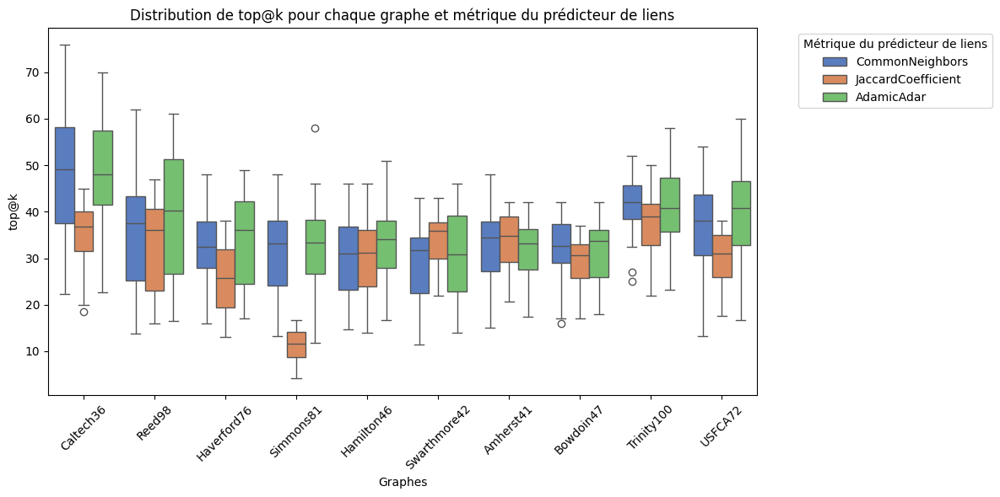

In [ ]:
plot_box_plot(results_df, "top@k")

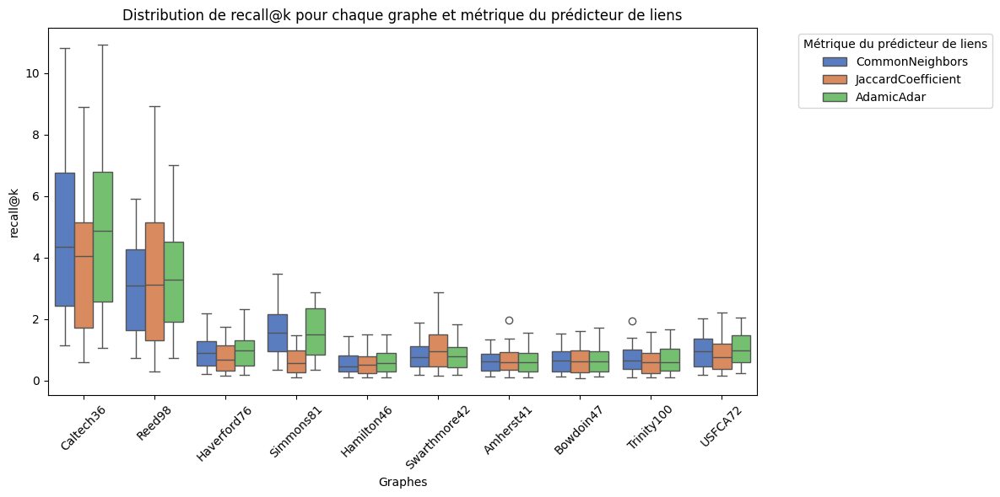

In [ ]:
plot_box_plot(results_df, "recall@k")

In [ ]:
# tracer les scores en fonction de la fraction d'arêtes retirée et du k pour chaque métrique de prédiction de lien
def plot_metric_evolution(df, metric_name, choix='fraction_removed'):
    plt.figure(figsize=(12, 6))
    df_metric = df[df['metric'] == metric_name]

    # Ajouter 'link_predictor' comme hue pour différencier les prédicteurs de liens
    sns.lineplot(data=df_metric, x='graph', y='score (%)', hue='link_predictor', style=choix, markers=True, dashes=False)

    plt.title(f'Évolution de {metric_name} en fonction des graphes et des métriques de prédicteurs de liens')
    plt.xlabel('Graphes')
    plt.ylabel(metric_name)
    plt.xticks(rotation=45)
    if choix == 'fraction_removed':
      plt.legend(title='Métrique du prédicteur de liens et fraction d\'arêtes retirées', bbox_to_anchor=(1.05, 1), loc='upper left')
    elif choix == 'k':
      plt.legend(title='Métrique du prédicteur de liens et valeur de k', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

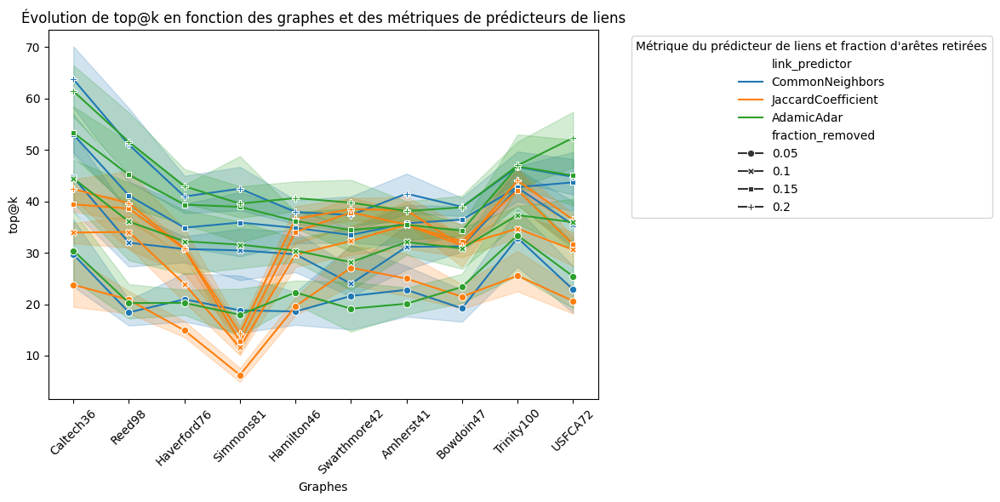

In [ ]:
plot_metric_evolution(results_df, 'top@k', choix='fraction_removed')


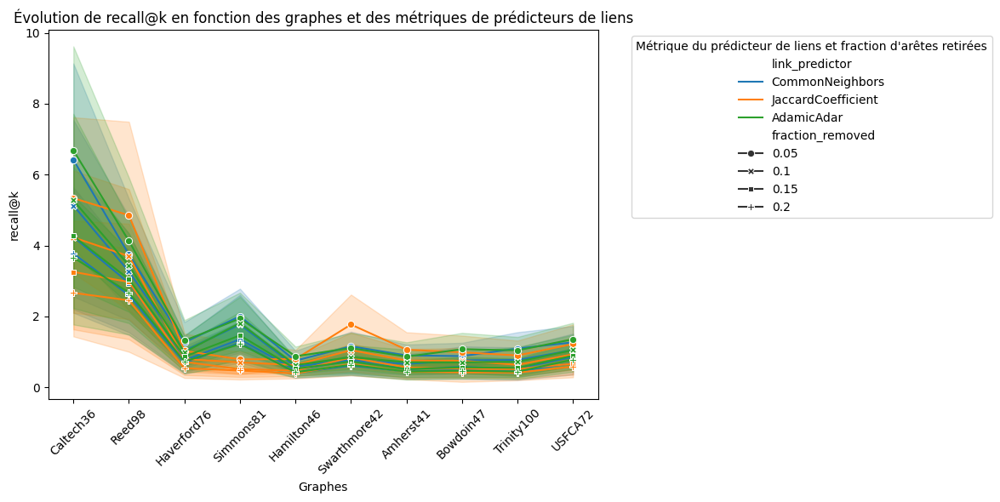

In [ ]:
plot_metric_evolution(results_df, 'recall@k', choix='fraction_removed')

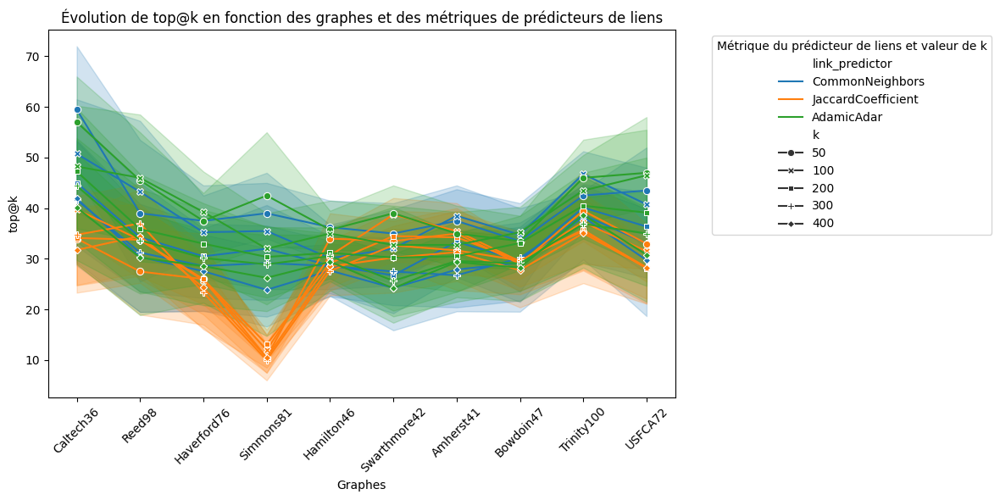

In [ ]:
plot_metric_evolution(results_df, 'top@k', choix='k')

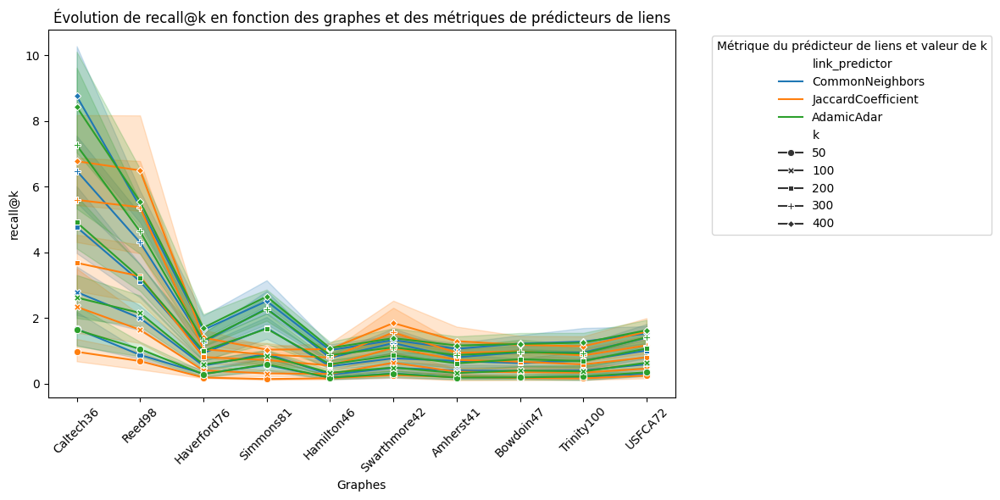

In [ ]:
plot_metric_evolution(results_df, 'recall@k', choix='k')

In [ ]:
# @title Comparaison des coefficients de clustering globaux pour ces graphes

for graph in subset_graphs:
  file_path = f'/content/fb100_extracted/data/{graph}'
  network = nx.read_gml(file_path)
  # Calcul du coefficient de clustering global
  clustering_global = nx.transitivity(network)
  print(f"Le coefficient de clustering global pour {graph[:-4]} est : {np.round(clustering_global,4)}")


Le coefficient de clustering global pour Caltech36 est : 0.2913
Le coefficient de clustering global pour Reed98 est : 0.2207
Le coefficient de clustering global pour Haverford76 est : 0.2505
Le coefficient de clustering global pour Simmons81 est : 0.2124
Le coefficient de clustering global pour Hamilton46 est : 0.2192
Le coefficient de clustering global pour Swarthmore42 est : 0.2267
Le coefficient de clustering global pour Amherst41 est : 0.2331
Le coefficient de clustering global pour Bowdoin47 est : 0.2163
Le coefficient de clustering global pour Hamilton46 est : 0.2192
Le coefficient de clustering global pour Trinity100 est : 0.228
Le coefficient de clustering global pour USFCA72 est : 0.1907


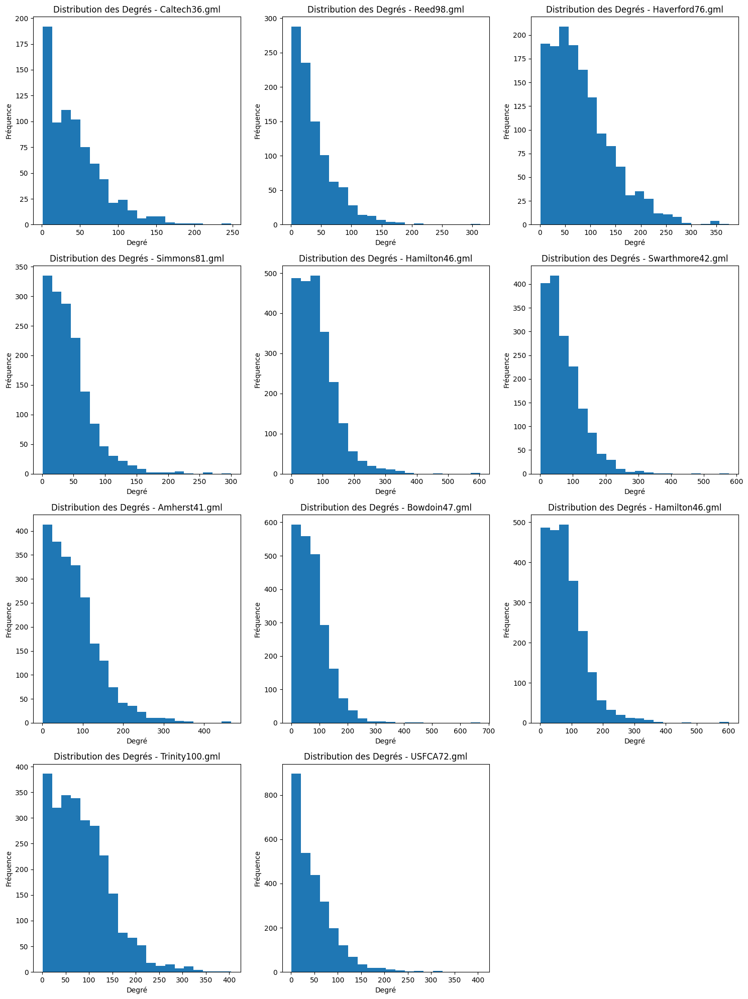

In [ ]:
# @title Comparaison des distributions des degrés pour ces graphes
n_graphs = len(subset_graphs)
n_cols = 3
n_rows = (n_graphs + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))

axes = axes.flatten()

for i, graph in enumerate(subset_graphs):
    file_path = f'/content/fb100_extracted/data/{graph}'
    network = nx.read_gml(file_path)

    # Calcul des degrés
    degrees = [deg for node, deg in network.degree()]

    # Création de l'histogramme
    axes[i].hist(degrees, bins=20)
    axes[i].set_title(f'Distribution des Degrés - {graph}')
    axes[i].set_xlabel('Degré')
    axes[i].set_ylabel('Fréquence')

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# @title Longueur moyenne du chemin le plus court dans les composantes connexes des graphes
for graph in subset_graphs:
  file_path = f'/content/fb100_extracted/data/{graph}'
  network = nx.read_gml(file_path)
  # retirer les noeuds les moins connectés
  network.remove_nodes_from([node for node, degree in dict(network.degree()).items() if degree < 3])
  # Calcul du average path length pour chaque composante connexe
  components = list(nx.connected_components(network))
  for component in components:
    subgraph = network.subgraph(component)
    avg_path_length = nx.average_shortest_path_length(subgraph)
    print(f"Longueur moyenne du chemin dans la composante connexe pour {graph[:-4]} : {np.round(avg_path_length,3)}")

Longueur moyenne du chemin dans la composante connexe pour Caltech36 : 2.201
Longueur moyenne du chemin dans la composante connexe pour Reed98 : 2.36
Longueur moyenne du chemin dans la composante connexe pour Haverford76 : 2.184
Longueur moyenne du chemin dans la composante connexe pour Simmons81 : 2.492
Longueur moyenne du chemin dans la composante connexe pour Hamilton46 : 2.324
Longueur moyenne du chemin dans la composante connexe pour Swarthmore42 : 2.289
Longueur moyenne du chemin dans la composante connexe pour Amherst41 : 2.353
Longueur moyenne du chemin dans la composante connexe pour Bowdoin47 : 2.383
Longueur moyenne du chemin dans la composante connexe pour Hamilton46 : 2.324
Longueur moyenne du chemin dans la composante connexe pour Trinity100 : 2.381
Longueur moyenne du chemin dans la composante connexe pour USFCA72 : 2.595
Longueur moyenne du chemin dans la composante connexe pour USFCA72 : 1.0


## Question 5 : Find missing labels with the label propagation algorithms

In [ ]:
def fisher_yates_shuffle(arr):
    n = len(arr)
    for i in range(n - 1, 0, -1):  # Parcours du tableau de droite à gauche
        j = random.randint(0, i)   # Génère un indice aléatoire entre 0 et i
        arr[i], arr[j] = arr[j], arr[i]  # Échange les éléments arr[i] et arr[j]
    return arr


def label_propagation_semi_supervised(graph, attribut, missing_nodes, max_iter, debut, fin, device='cpu'):
  """
  graph : Le graphe de type networkx
  attribut : Attribut considéré
  missing_nodes : Liste des noeuds manquants dont l'on souhaite connaître le label
  (remarque : les identifiants des noeuds sont des chaînes de caractères)
  max_iter : Nombre maximal d'itérations
  debut : Valeur minimale de l'attribut à l'initialisation aléatoire
  fin : Valeur maximale de l'attribut à l'initialisation aléatoire
  device : CPU ou GPU

  return : La liste des labels propagés pour tous les noeuds
  """
  for missing_node in missing_nodes:
    # on assigne un entier entre debut et fin à chaque noeud manquant pour l'attribut spécifié
    # (on met debut et fin en hyperparamètres, mais on a testé au préalable différentes valeurs
    # les différences de performances sont faibles, de l'ordre de quelques %, en les optimisant)
    graph.nodes[missing_node][attribut] = random.randint(debut, fin)

  label_change = 1
  t = 0
  while label_change > 0 and t < max_iter:
    label_change = 0

    for missing_node in fisher_yates_shuffle(missing_nodes):
      neighbors = list(graph.neighbors(missing_node))
      labels_neighbors = [graph.nodes[neighbor][attribut] for neighbor in neighbors]
      graph.nodes[missing_node][attribut] = torch.argmax(torch.bincount(torch.tensor(labels_neighbors, dtype=torch.long, device=device))).item()
      label_change+=1
    t+=1

  missing_labels_propagated = [graph.nodes[node].get(attribut) for node in missing_nodes]
  return torch.tensor(missing_labels_propagated, dtype=torch.long)

In [ ]:
def evaluating_label_propagation(graph, attributes, percentages_lpa):
  # on crée un dictionnaire vide qui contiendra les métriques MAE, accuracy et f1_score pour chaque pourcentage et chaque attribut
  scores = {}
  for attribut in attributes:
    #print(f"\n Evaluating label propagation for attribute {attribut}...")
    scores[attribut] = {}
    for percentage in percentages_lpa:
      # on réinitialise une copie du graphe
      new_network = network.copy()
      #print(f"\n Testing percentage value of {percentage}")
      scores[attribut][percentage] = {}
      # on calcule le nombre de noeuds à retirer correspondant au pourcentage de noeud à retirer
      n_samples = int(percentage*len(new_network.nodes()))
      # on tire aléatoirement les noeuds dont les attribut seront supprimées
      missing_nodes = random.sample(list(new_network.nodes()), n_samples)

      # on applique l'algorithme de label propagation implémenté précédemment
      propagated_labels = label_propagation_semi_supervised(graph=new_network,  attribut = attribut, missing_nodes=missing_nodes, max_iter=100, debut=1, fin=10,  device='cpu')

      # on calcule les métriques pour évaluer les performances de label propagation
      ground_truth = torch.tensor([graph.nodes[node].get(attribut) for node in missing_nodes], dtype=torch.long)
      #ground_truth = torch.tensor(list(labels_ini.values()))
      accuracy = (1/n_samples)*torch.sum(ground_truth==propagated_labels)
      mae = (1/n_samples)*torch.sum(torch.abs(ground_truth-propagated_labels))
      f1 = f1_score(ground_truth, propagated_labels, average='weighted')


      # on stocke les métriques dans le dictionnaire
      scores[attribut][percentage]['accuracy'] = np.round(accuracy.item(),2)
      scores[attribut][percentage]['mae'] = np.round(mae.item(),2)
      scores[attribut][percentage]['f1'] = np.round(f1,2)


  return scores

In [ ]:
# attributs à tester
attributes = ['dorm', 'major_index', 'gender']

# pourcentage d'attributs de noeuds à retirer aléatoirement dans le graphe pour l'algorithme de label propagation
percentages_lpa = [0.1, 0.2, 0.3]

# initialisation d'un dictionnaire qui contiendra les résultats pour chaque graphe
results_lpa = {}

# choix de 13 graphes du dataset à tester
# on choisit à la fois des petites universités comme Simmons, des universités religieuses (Pepperdine)
# des universités publiques (Vermont, Berkeley, Michigan) et privées, et des membres de la Ivy League (Princeton, Harvard)
# des institutions orientées recherche (Rice, Carnegie, NYU) ou orientées "liberal arts" (Williams)
list_networks = ['Simmons81', 'Williams40', 'Pepperdine86', 'Rice31', 'UChicago30', 'Princeton12', 'Carnegie49', 'Vermont70', 'Stanford3', 'Harvard1', 'NYU9', 'Berkeley13', 'Michigan23']
# lecture du fichier .gml associé et conversion en objet de type graph
for network_name in tqdm(list_networks):
  results_lpa[network_name] = []
  file_path = f'/content/fb100_extracted/data/{network_name}.gml'
  network = nx.read_gml(file_path)
  results_lpa[network_name].append(evaluating_label_propagation(network, attributes=attributes, percentages_lpa=percentages_lpa))

100%|██████████| 13/13 [1:07:23<00:00, 311.06s/it]


In [ ]:
# attributs à tester
attributes = ['dorm', 'major_index', 'gender']

# pourcentage d'attributs de noeuds à retirer aléatoirement dans le graphe pour l'algorithme de label propagation
percentages_lpa = [0.1, 0.2, 0.3]

# initialisation d'un dictionnaire qui contiendra les résultats pour chaque graphe
results_lpa = {}

# choix de 13 graphes du dataset à tester
# on choisit à la fois des petites universités comme Simmons, des universités religieuses (Pepperdine)
# des universités publiques (Vermont, Berkeley, Michigan) et privées, et des membres de la Ivy League (Princeton, Harvard)
# des institutions orientées recherche (Rice, Carnegie, NYU) ou orientées "liberal arts" (Williams)
list_networks = ['Simmons81', 'Williams40', 'Pepperdine86', 'Rice31', 'UChicago30', 'Princeton12', 'Carnegie49', 'Vermont70', 'Stanford3', 'Harvard1', 'NYU9', 'Berkeley13', 'Michigan23']
# lecture du fichier .gml associé et conversion en objet de type graph
for network_name in tqdm(list_networks):
  results_lpa[network_name] = []
  file_path = f'/content/fb100_extracted/data/{network_name}.gml'
  network = nx.read_gml(file_path)
  results_lpa[network_name].append(evaluating_label_propagation(network, attributes=attributes, percentages_lpa=percentages_lpa))

100%|██████████| 13/13 [1:06:04<00:00, 304.96s/it]


In [ ]:
# enregistrer les résultats au format .json
with open("/content/results_lpa2.json", "w") as f:
    json.dump(results_lpa, f)

In [ ]:
for network_name, result in results_lpa.items():
  print(f"{network_name} : {result}")

Simmons81 : [{'dorm': {0.1: {'accuracy': 0.51, 'mae': 35.37, 'f1': 0.2}, 0.2: {'accuracy': 0.52, 'mae': 38.18, 'f1': 0.21}, 0.3: {'accuracy': 0.5, 'mae': 39.47, 'f1': 0.17}}, 'major_index': {0.1: {'accuracy': 0.32, 'mae': 47.87, 'f1': 0.13}, 0.2: {'accuracy': 0.17, 'mae': 38.04, 'f1': 0.03}, 0.3: {'accuracy': 0.15, 'mae': 42.91, 'f1': 0.02}}, 'gender': {0.1: {'accuracy': 0.93, 'mae': 0.07, 'f1': 0.32}, 0.2: {'accuracy': 0.91, 'mae': 0.09, 'f1': 0.32}, 0.3: {'accuracy': 0.93, 'mae': 0.07, 'f1': 0.32}}}]
Williams40 : [{'dorm': {0.1: {'accuracy': 0.51, 'mae': 149.89, 'f1': 0.16}, 0.2: {'accuracy': 0.47, 'mae': 172.9, 'f1': 0.15}, 0.3: {'accuracy': 0.5, 'mae': 169.71, 'f1': 0.16}}, 'major_index': {0.1: {'accuracy': 0.27, 'mae': 16.71, 'f1': 0.05}, 0.2: {'accuracy': 0.24, 'mae': 17.13, 'f1': 0.01}, 0.3: {'accuracy': 0.26, 'mae': 17.59, 'f1': 0.01}}, 'gender': {0.1: {'accuracy': 0.58, 'mae': 0.45, 'f1': 0.43}, 0.2: {'accuracy': 0.58, 'mae': 0.46, 'f1': 0.39}, 0.3: {'accuracy': 0.51, 'mae': 0

In [ ]:
# Afficher les résultats sous forme d'un DataFrame pour plus de lisibilité

# Initialiser une liste vide pour stocker les lignes
data = []
for graph_name, graph_results in results_lpa.items():
    for result in graph_results:
        # Pour chaque attribut (dorm, major_index, gender)
        for attribute, percentages in result.items():
            # Pour chaque pourcentage (10%, 20%, 30%)
            for percentage, metrics in percentages.items():
                data.append({
                    'Graph': graph_name,
                    'Attribute': attribute,
                    'Percentage': percentage,
                    'Accuracy': metrics['accuracy'],
                    'MAE': metrics['mae'],
                    'F1': metrics['f1']
                })

# Création du DataFrame
df_results_lpa = pd.DataFrame(data)

# Afficher le DataFrame en entier
pd.set_option('display.max_rows', None)
print(df_results_lpa)
pd.reset_option('display.max_rows')

            Graph    Attribute  Percentage  Accuracy     MAE    F1
0       Simmons81         dorm         0.1      0.51   35.37  0.20
1       Simmons81         dorm         0.2      0.52   38.18  0.21
2       Simmons81         dorm         0.3      0.50   39.47  0.17
3       Simmons81  major_index         0.1      0.32   47.87  0.13
4       Simmons81  major_index         0.2      0.17   38.04  0.03
5       Simmons81  major_index         0.3      0.15   42.91  0.02
6       Simmons81       gender         0.1      0.93    0.07  0.32
7       Simmons81       gender         0.2      0.91    0.09  0.32
8       Simmons81       gender         0.3      0.93    0.07  0.32
9      Williams40         dorm         0.1      0.51  149.89  0.16
10     Williams40         dorm         0.2      0.47  172.90  0.15
11     Williams40         dorm         0.3      0.50  169.71  0.16
12     Williams40  major_index         0.1      0.27   16.71  0.05
13     Williams40  major_index         0.2      0.24   17.13  

In [ ]:
# Afficher les résultats sous forme d'un DataFrame pour plus de lisibilité

# Initialiser une liste vide pour stocker les lignes
data = []
for graph_name, graph_results in results_lpa.items():
    for result in graph_results:
        # Pour chaque attribut (dorm, major_index, gender)
        for attribute, percentages in result.items():
            # Pour chaque pourcentage (10%, 20%, 30%)
            for percentage, metrics in percentages.items():
                data.append({
                    'Graph': graph_name,
                    'Attribute': attribute,
                    'Percentage': percentage,
                    'Accuracy': metrics['accuracy'],
                    'MAE': metrics['mae'],
                    'F1': metrics['f1']
                })

# Création du DataFrame
df_results_lpa = pd.DataFrame(data)

# Afficher le DataFrame en entier
pd.set_option('display.max_rows', None)
print(df_results_lpa)
pd.reset_option('display.max_rows')

            Graph    Attribute  Percentage  Accuracy     MAE    F1
0       Simmons81         dorm         0.1      0.58   26.73  0.52
1       Simmons81         dorm         0.2      0.49   36.37  0.40
2       Simmons81         dorm         0.3      0.51   37.64  0.39
3       Simmons81  major_index         0.1      0.27   61.27  0.21
4       Simmons81  major_index         0.2      0.17   39.23  0.10
5       Simmons81  major_index         0.3      0.15   39.24  0.09
6       Simmons81       gender         0.1      0.95    0.05  0.93
7       Simmons81       gender         0.2      0.92    0.08  0.89
8       Simmons81       gender         0.3      0.93    0.07  0.90
9      Williams40         dorm         0.1      0.43  184.55  0.33
10     Williams40         dorm         0.2      0.51  165.28  0.40
11     Williams40         dorm         0.3      0.47  176.90  0.36
12     Williams40  major_index         0.1      0.27   15.87  0.18
13     Williams40  major_index         0.2      0.22   17.61  

In [ ]:
# Test : comparaison des résultats à l'exemple donné (graphe Duke)

network_name='Duke14'
file_path = f'/content/fb100_extracted/data/{network_name}.gml'
network = nx.read_gml(file_path)
evaluating_label_propagation(network, attributes=attributes, percentages_lpa=percentages_lpa)

{'dorm': {0.1: {'accuracy': 0.51, 'mae': 67.87, 'f1': 0.24},
  0.2: {'accuracy': 0.43, 'mae': 83.15, 'f1': 0.14},
  0.3: {'accuracy': 0.39, 'mae': 89.55, 'f1': 0.1}},
 'major_index': {0.1: {'accuracy': 0.28, 'mae': 39.65, 'f1': 0.1},
  0.2: {'accuracy': 0.23, 'mae': 55.69, 'f1': 0.07},
  0.3: {'accuracy': 0.22, 'mae': 58.54, 'f1': 0.06}},
 'gender': {0.1: {'accuracy': 0.63, 'mae': 0.41, 'f1': 0.47},
  0.2: {'accuracy': 0.64, 'mae': 0.39, 'f1': 0.46},
  0.3: {'accuracy': 0.6, 'mae': 0.43, 'f1': 0.43}}}

In [ ]:
# Pour comprendre les performances, on peut regarder le nombre de valeurs prises par les différents attributs pour chaque graphe
# attribut major_index
list_networks = ['Simmons81', 'Williams40', 'Pepperdine86', 'Rice31', 'UChicago30', 'Princeton12', 'Carnegie49', 'Vermont70', 'Stanford3', 'Harvard1', 'NYU9', 'Berkeley13', 'Michigan23']
mean_missing_values_major = 0
for network_name in list_networks:
  file_path = f'/content/fb100_extracted/data/{network_name}.gml'
  network = nx.read_gml(file_path)
  indices = list(nx.get_node_attributes(network, 'major_index').values())
  indices = Counter(indices)
  missing = indices[0]
  indices = [value for value, count in indices.items() if count > 1]
  indices = sorted(indices)
  mean_missing = np.round((missing/network.number_of_nodes())*100,2)
  mean_missing_values_major += mean_missing
  print(f"Graphe {network_name}")
  print(f"Nombre de valeurs différentes prises par l'attribut major_index : {len(indices)-1}")
  print(f"Nombre de valeurs manquantes pour l'attribut major_index : {missing}")
  print(f"Pourcentage de valeurs manquantes (par rapport au nombre total de noeuds) : {mean_missing} %")
  print(f"Valeurs prises pour l'attribut major_index : {indices}")
  print('-'*20)


Graphe Simmons81
Nombre de valeurs différentes prises par l'attribut major_index : 50
Nombre de valeurs manquantes pour l'attribut major_index : 164
Pourcentage de valeurs manquantes (par rapport au nombre total de noeuds) : 10.8 %
Valeurs prises pour l'attribut major_index : [0, 235, 236, 238, 239, 240, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 277, 278, 279, 280, 281, 283, 284, 286, 287, 288, 289, 291, 292]
--------------------
Graphe Williams40
Nombre de valeurs différentes prises par l'attribut major_index : 44
Nombre de valeurs manquantes pour l'attribut major_index : 705
Pourcentage de valeurs manquantes (par rapport au nombre total de noeuds) : 25.27 %
Valeurs prises pour l'attribut major_index : [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 27, 28, 30, 31, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 48, 49, 52, 5

In [ ]:
# attribut dorm
list_networks = ['Simmons81', 'Williams40', 'Pepperdine86', 'Rice31', 'UChicago30', 'Princeton12', 'Carnegie49', 'Vermont70', 'Stanford3', 'Harvard1', 'NYU9', 'Berkeley13', 'Michigan23']
mean_missing_values_dorm = 0
for network_name in list_networks:
  file_path = f'/content/fb100_extracted/data/{network_name}.gml'
  network = nx.read_gml(file_path)
  indices = list(nx.get_node_attributes(network, 'dorm').values())
  indices = Counter(indices)
  missing = indices[0]
  indices = [value for value, count in indices.items() if count > 1]
  indices = sorted(indices)
  mean_missing = np.round((missing/network.number_of_nodes())*100,2)
  mean_missing_values_dorm += mean_missing
  print(f"Graphe {network_name}")
  print(f"Nombre de valeurs différentes prises par l'attribut dorm : {len(indices)-1}")
  print(f"Nombre de valeurs manquantes pour l'attribut dorm : {missing}")
  print(f"Pourcentage de valeurs manquantes (par rapport au nombre total de noeuds) : {mean_missing} %")
  print(f"Valeurs prises pour l'attribut dorm : {indices}")
  print('-'*20)

Graphe Simmons81
Nombre de valeurs différentes prises par l'attribut dorm : 10
Nombre de valeurs manquantes pour l'attribut dorm : 660
Pourcentage de valeurs manquantes (par rapport au nombre total de noeuds) : 43.48 %
Valeurs prises pour l'attribut dorm : [0, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
--------------------
Graphe Williams40
Nombre de valeurs différentes prises par l'attribut dorm : 32
Nombre de valeurs manquantes pour l'attribut dorm : 966
Pourcentage de valeurs manquantes (par rapport au nombre total de noeuds) : 34.62 %
Valeurs prises pour l'attribut dorm : [0, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 357, 358, 359]
--------------------
Graphe Pepperdine86
Nombre de valeurs différentes prises par l'attribut dorm : 21
Nombre de valeurs manquantes pour l'attribut dorm : 2041
Pourcentage de valeurs manquantes (par rapport au nombre total de noeuds) : 59.25 %
Valeurs pris

In [ ]:
# attribut gender
list_networks = ['Simmons81', 'Williams40', 'Pepperdine86', 'Rice31', 'UChicago30', 'Princeton12', 'Carnegie49', 'Vermont70', 'Stanford3', 'Harvard1', 'NYU9', 'Berkeley13', 'Michigan23']
mean_missing_values_gender = 0
for network_name in list_networks:
  file_path = f'/content/fb100_extracted/data/{network_name}.gml'
  network = nx.read_gml(file_path)
  indices = list(nx.get_node_attributes(network, 'gender').values())
  indices = Counter(indices)
  missing = indices[0]
  indices = [value for value, count in indices.items() if count > 1]
  indices = sorted(indices)
  mean_missing = np.round((missing/network.number_of_nodes())*100,2)
  mean_missing_values_gender += mean_missing
  print(f"Graphe {network_name}")
  print(f"Nombre de valeurs différentes prises par l'attribut gender : {len(indices)-1}")
  print(f"Nombre de valeurs manquantes pour l'attribut gender : {missing}")
  print(f"Pourcentage de valeurs manquantes (par rapport au nombre total de noeuds) : {mean_missing} %")
  print(f"Valeurs prises pour l'attribut gender : {indices}")
  print('-'*20)

Graphe Simmons81
Nombre de valeurs différentes prises par l'attribut gender : 2
Nombre de valeurs manquantes pour l'attribut gender : 96
Pourcentage de valeurs manquantes (par rapport au nombre total de noeuds) : 6.32 %
Valeurs prises pour l'attribut gender : [0, 1, 2]
--------------------
Graphe Williams40
Nombre de valeurs différentes prises par l'attribut gender : 2
Nombre de valeurs manquantes pour l'attribut gender : 256
Pourcentage de valeurs manquantes (par rapport au nombre total de noeuds) : 9.18 %
Valeurs prises pour l'attribut gender : [0, 1, 2]
--------------------
Graphe Pepperdine86
Nombre de valeurs différentes prises par l'attribut gender : 2
Nombre de valeurs manquantes pour l'attribut gender : 167
Pourcentage de valeurs manquantes (par rapport au nombre total de noeuds) : 4.85 %
Valeurs prises pour l'attribut gender : [0, 1, 2]
--------------------
Graphe Rice31
Nombre de valeurs différentes prises par l'attribut gender : 2
Nombre de valeurs manquantes pour l'attribut

In [ ]:
# afficher les pourcentages de valeurs manquantes en moyenne sur l'ensemble de ces graphes
print(f"Pour l'attribut dorm, le pourcentage de valeurs manquantes en moyenne sur le sous-ensemble de ces graphes est de {np.round(mean_missing_values_dorm/13,2)} %")
print(f"Pour l'attribut major_index, le pourcentage de valeurs manquantes en moyenne sur le sous-ensemble de ces graphes est de {np.round(mean_missing_values_major/13,2)} %")
print(f"Pour l'attribut gender, le pourcentage de valeurs manquantes en moyenne sur le sous-ensemble de ces graphes est de {np.round(mean_missing_values_gender/13,2)} %" )

Pour l'attribut dorm, le pourcentage de valeurs manquantes en moyenne sur le sous-ensemble de ces graphes est de 40.86 %
Pour l'attribut major_index, le pourcentage de valeurs manquantes en moyenne sur le sous-ensemble de ces graphes est de 17.18 %
Pour l'attribut gender, le pourcentage de valeurs manquantes en moyenne sur le sous-ensemble de ces graphes est de 8.69 %


## Question 6 : Communities detection with the FB100 datasets

In [ ]:
# question de recherche

# on s'interroge sur l'assortativité de l'attribut year (année de diplomation)

# on initialise le dictionnaire qui contiendra les assortativities et on crée une clé pour chaque attribut
assortativities = {}
assortativities['year'] = []
# on initialise la liste qui contiendra la taille des noeuds de chaque network
network_sizes = []

# on parcourt l'ensemble des networks pour calculer les assortativity par attribut
# on remplit en même temps la liste network_sizes
# (on parcourt 1 seule fois l'ensemble des networks pour tout calculer car coûteux de charger les gros graphes)
for network in tqdm(gml_files):
  file_path = f'/content/fb100_extracted/data/{network}'
  graphe = nx.read_gml(file_path)
  network_sizes.append(graphe.number_of_nodes())
  assortativities['year'].append(nx.attribute_assortativity_coefficient(graphe, attribute='year'))

100%|██████████| 100/100 [49:04<00:00, 29.45s/it]


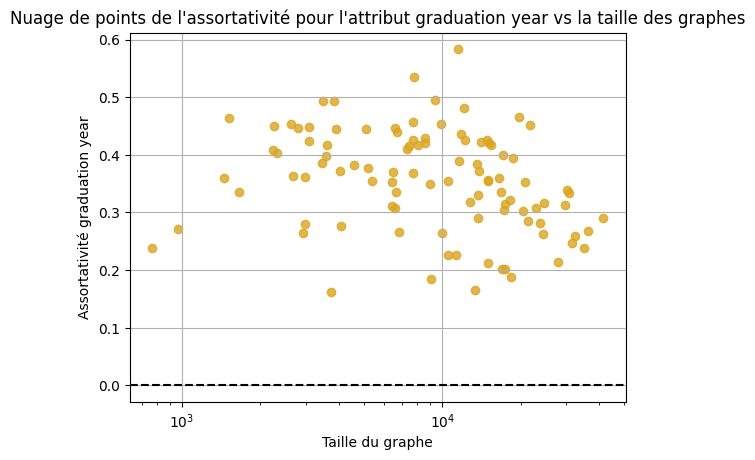

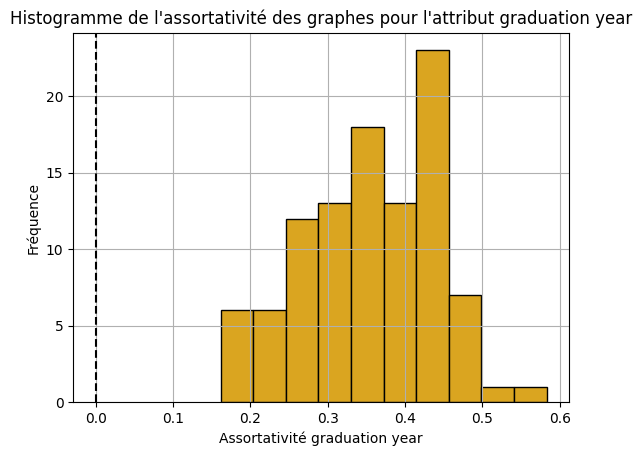

In [ ]:
# tracer les scatter plot et les histogrammes des assortativity pour chacun des attributs
# on affiche le nuage de points assortativity vs taille du graphe
plt.scatter(network_sizes, assortativities['year'], color='goldenrod', alpha=0.8)
# on ajoute une ligne en pointillé indiquant une assortativité nulle
plt.axhline(y=0, color='black', linestyle='--')
plt.title(f'Nuage de points de l\'assortativité pour l\'attribut graduation year vs la taille des graphes')
plt.xlabel('Taille du graphe')
plt.xscale('log')
plt.ylabel(f'Assortativité graduation year')
plt.grid(True)
plt.show()

# on affiche la distribution des assortativity
plt.hist(assortativities['year'], color='goldenrod', edgecolor='black')
# on ajoute une ligne en pointillé indiquant une assortativité nulle
plt.axvline(x=0, color='black', linestyle='--')
plt.title(f'Histogramme de l\'assortativité des graphes pour l\'attribut graduation year')
plt.xlabel(f'Assortativité graduation year')
plt.ylabel('Fréquence')
plt.grid(True)
plt.show()

In [ ]:
# on veut afficher quelques graphes en colorant les noeuds par rapport à l'attribut 'year'

# on commence par sélectionner un sous-ensemble de graphes d'intérêt
list_networks = ['Caltech36', 'Reed98', 'Haverford76', 'Simmons81', 'Trinity100', 'Maine59', 'Bingham82', 'GWU54', 'USF51']

# on stocke ces graphes dans un dictionnaire
graphs = {}
for network_name in list_networks:
    file_path = f'/content/fb100_extracted/data/{network_name}.gml'
    network = nx.read_gml(file_path)
    graphs[network_name] = network

graph_names = graphs.keys()

9it [27:39, 184.44s/it]


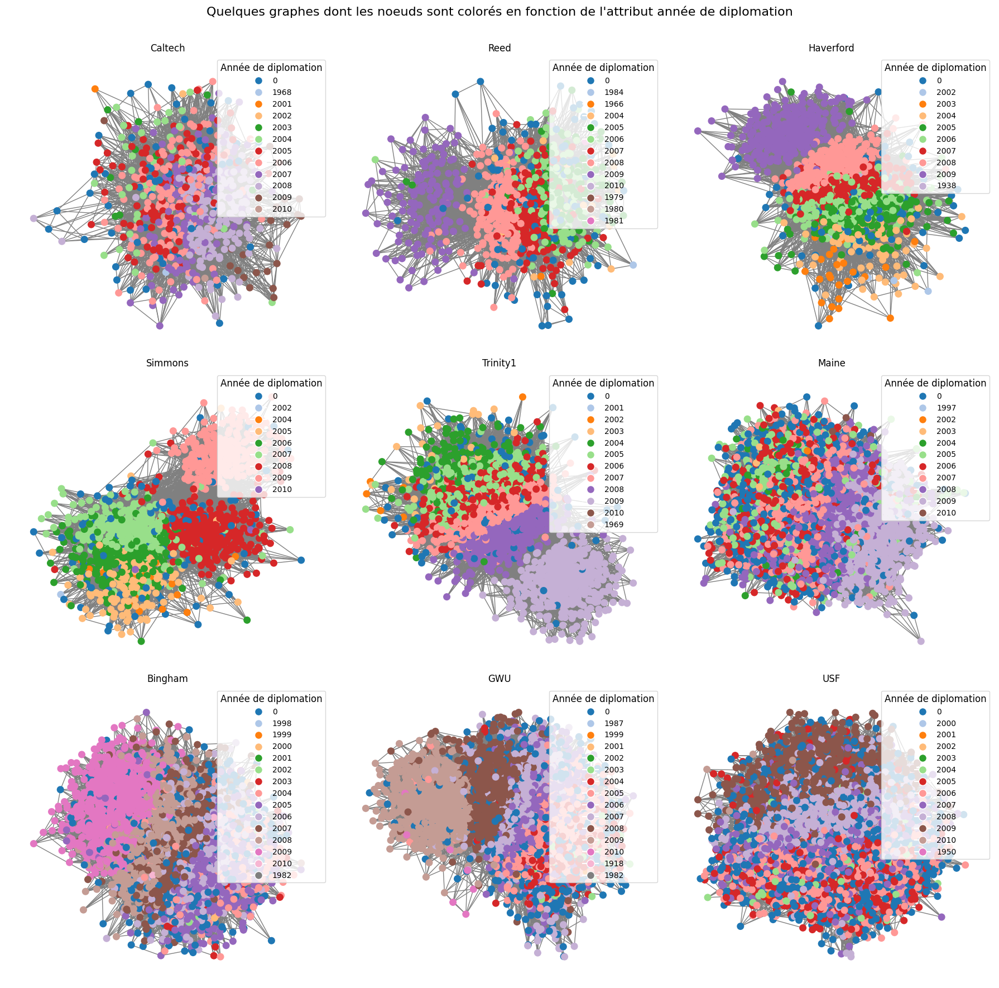

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(18, 18))

for idx, (graph_name, G) in tqdm(enumerate(graphs.items())):
    row = idx // 3
    col = idx % 3
    ax = axes[row, col]

    # Récupérer les noeuds les moins connectés pour les masquer
    # (pour une meilleure visualisation, on peut ainsi visualiser la composante principale)
    threshold = 6
    less_connected_nodes = [node for node, degree in G.degree() if degree < threshold]
    nodes_to_display = [node for node in G.nodes() if node not in less_connected_nodes]

    # Réduire le graphe aux noeuds les plus connectés
    G = G.subgraph(nodes_to_display)

    year_values = list(set(nx.get_node_attributes(G, 'year').values()))

    cmap = cmaps['tab20']
    color_map = {value: cmap(i) for i, value in enumerate(year_values)}

    # Colorer les noeuds en fonction de 'year'
    node_colors = [color_map[G.nodes[node]['year']] for node in G.nodes()]

    nx.draw(G, node_size=70, node_color=node_colors, font_size=12, font_weight='bold', edge_color='gray', ax=ax)

    ax.set_title(graph_name[:-2])

    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_map[year], markersize=10) for year in year_values]
    labels = [str(year) for year in year_values]

    ax.legend(handles, labels, title="Année de diplomation", loc='upper right', fontsize=10, title_fontsize=12)


plt.tight_layout()
plt.suptitle('Quelques graphes dont les noeuds sont colorés en fonction de l\'attribut année de diplomation', fontsize=16)
plt.subplots_adjust(top=0.93)
plt.show()

In [ ]:
# Détection de communautés : méthode 1
# Newman-Girvan
for network_name in tqdm(['Haverford76']) :
  file_path = f'/content/fb100_extracted/data/{network_name}.gml'
  network = nx.read_gml(file_path)
  print(f"\n Traitement du graphe {network_name}")

  k = 10
  comp = nx.community.girvan_newman(network)
  for communities, i in zip(itertools.islice(comp, k), range(1,11)):
    print(f"Step {i}")
    print(f"Nombre de communautés: {len(communities)}")
    print(f"Taille des communautés: {tuple(len(c) for c in communities)}" )
    for community in communities:
      print(sorted(community))
    print('-'*20)

  betweenness = nx.betweenness_centrality(network)


  0%|          | 0/1 [00:00<?, ?it/s]


 Traitement du graphe Haverford76
Step 1
Nombre de communautés: 2
Taille des communautés: (1444, 2)
['0', '1', '10', '100', '1000', '1001', '1002', '1003', '1004', '1005', '1006', '1007', '1008', '1009', '101', '1010', '1011', '1012', '1013', '1014', '1015', '1016', '1017', '1018', '1019', '102', '1020', '1021', '1022', '1023', '1024', '1025', '1026', '1027', '1028', '1029', '103', '1030', '1031', '1032', '1033', '1034', '1035', '1036', '1037', '1038', '1039', '104', '1040', '1041', '1042', '1043', '1044', '1045', '1046', '1047', '1048', '1049', '105', '1050', '1051', '1052', '1053', '1054', '1055', '1056', '1057', '1058', '1059', '106', '1060', '1061', '1062', '1063', '1064', '1065', '1066', '1067', '1068', '1069', '107', '1070', '1071', '1072', '1073', '1074', '1075', '1076', '1077', '1078', '1079', '108', '1080', '1081', '1082', '1083', '1084', '1085', '1086', '1087', '1088', '1089', '109', '1090', '1091', '1092', '1093', '1094', '1095', '1096', '1097', '1098', '1099', '11', '110',

100%|██████████| 1/1 [11:29<00:00, 689.12s/it]


In [ ]:
# on affiche les 10 valeurs de betweenness les plus élevées pour Haverford
sorted(betweenness.values(), reverse=True)[:10]

[0.01805049898268725,
 0.014277145021971896,
 0.012432071192047783,
 0.011370218554558236,
 0.011297684411952755,
 0.010460284262869173,
 0.009524719443043927,
 0.009054386883529929,
 0.007862205003215295,
 0.007835235842260568]

In [ ]:
# Détection de communautés : méthode 2
# on utilise maintenant l'algorithme de Louvain

def louvain_plot_year_distribution(network_name, threshold):
# threshold est le seuil de degré au dessous duquel on masque les noeuds
# (pour éviter d'avoir de toutes petites communautés, ce qui rend aussi moins lisible la représentation graphique)
  file_path = f'/content/fb100_extracted/data/{network_name}.gml'
  network = nx.read_gml(file_path)
  print(f"\n Traitement du graphe {network_name}")

  # masquer les noeuds les moins connectés
  less_connected_nodes = [node for node, degree in network.degree() if degree < threshold]
  nodes_to_display = [node for node in network.nodes() if node not in less_connected_nodes]
  network = network.subgraph(nodes_to_display)

  louvain = list(nx.community.louvain_communities(network, seed=42))
  print(f"Nombre de communautés: {len(louvain)}")
  print(f"Taille des communautés: {tuple(len(c) for c in louvain)}" )
  # for community in louvain:
  #   print(sorted(community))

  # afficher les graphes où les noeuds sont colorés en fonction de leur communauté
  fig, axes = plt.subplots(1, 3, figsize=(16, 6))

  cmap = cmaps['tab10']
  color_map = {i: cmap(i) for i in range(len(louvain))}
  node_colors = [color_map[idx] for idx, community in enumerate(louvain) for node in community]
  nx.draw(network, node_size=70, node_color=node_colors, font_size=12, font_weight='bold', edge_color='gray', ax=axes[0])
  axes[0].set_title(f'{network_name[:-2]} - Graphe', fontsize=16)

  handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_map[i], markersize=10) for i in range(len(louvain))]
  labels = [str("Commu. ") + str(i) for i in range(len(louvain))]

  axes[0].legend(handles, labels, title="Communauté (Louvain)", loc='upper right', fontsize=10, title_fontsize=12)

  # regarder la distribution des années de diplomation par communauté en traçant un boxplot

  data = []
  for idx, community in enumerate(louvain):  # On assigne un index unique à chaque communauté
      for node in community:
          year_of_graduation = network.nodes[node]['year']
          data.append({'community': f"Com. {idx}", 'year': year_of_graduation})

  df = pd.DataFrame(data)

  plt.figure(figsize=(10, 6))
  sns.boxplot(x='community', y='year', data=df, hue='community',palette='Set2', ax=axes[1], legend=False)

  axes[1].set_title(f"Distribution des années de diplomation par communauté (Louvain)", fontsize=14)
  axes[1].set_xlabel("Communauté", fontsize=12)
  axes[1].set_ylabel("Année de diplomation", fontsize=12)
  y_max = df['year'].max()
  y_min = df[df['year'] > 0]['year'].min()
  axes[1].set_ylim(1984, y_max + 5)


  # # Calculer la proportion d'hommes, de femmes et de non-indiqués par communauté
  # gender_data = []
  # for idx, community in enumerate(louvain):  # Pour chaque communauté
  #     male_count = 0
  #     female_count = 0
  #     unspecified_count = 0
  #     total_count = len(community)

  #     for node in community:
  #         if 'gender' in network.nodes[node]:
  #             gender = network.nodes[node]['gender']
  #             if gender == 2:
  #                 male_count += 1
  #             elif gender == 1:
  #                 female_count += 1
  #             else:
  #                 unspecified_count += 1

  #     # Ajouter les données de genre pour cette communauté
  #     gender_data.append({
  #         'community': f"Com. {idx}",
  #         'male': male_count / total_count,
  #         'female': female_count / total_count,
  #         'unspecified': unspecified_count / total_count
  #     })

  # gender_df = pd.DataFrame(gender_data)

  # # Tracer les proportions de genre par communauté
  # gender_df.set_index('community', inplace=True)
  # gender_df.plot(kind='bar', stacked=True, ax=axes[2], color=['blue', 'pink', 'gray'], width=0.8)

  # axes[2].set_title(f"Genre par communauté", fontsize=16)
  # axes[2].set_xlabel("Communauté", fontsize=12)
  # axes[2].set_ylabel("Proportion", fontsize=12)
  # axes[2].legend(title="Genre", loc="upper left", labels=["Homme", "Femme", "Non indiqué"])

  statut_data = []
  for idx, community in enumerate(louvain):
      for node in community:
          student_fac = network.nodes[node].get('student_fac', 'Non spécifié')  # Utilisation de 'student_fac' ici
          statut_data.append({'community': f"Com. {idx}", 'student_fac': student_fac})

  statut_df = pd.DataFrame(statut_data)

  # Créer un barplot pour chaque communauté, en montrant la répartition des statuts
  sns.countplot(data=statut_df, x='community', hue='student_fac', palette='Set2', ax=axes[2])
  axes[2].set_title("Statuts par communauté")
  axes[2].set_xlabel("Communauté")
  axes[2].set_ylabel("Nombre de nœuds")
  axes[2].tick_params(axis='x', rotation=45)



  plt.tight_layout()
  plt.show()

  0%|          | 0/9 [00:00<?, ?it/s]


 Traitement du graphe Caltech36
Nombre de communautés: 8
Taille des communautés: (70, 107, 15, 127, 89, 100, 80, 114)


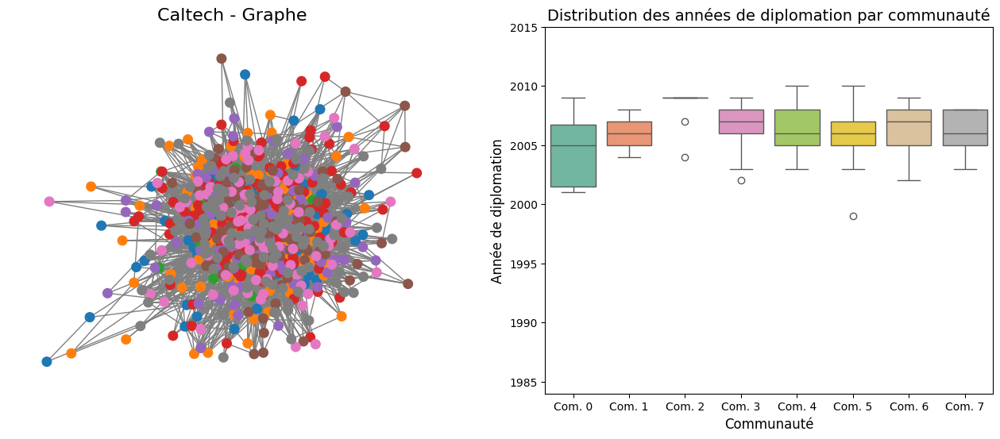

<Figure size 1000x600 with 0 Axes>

 11%|█         | 1/9 [00:06<00:49,  6.20s/it]


 Traitement du graphe Reed98
Nombre de communautés: 6
Taille des communautés: (195, 156, 57, 157, 5, 338)


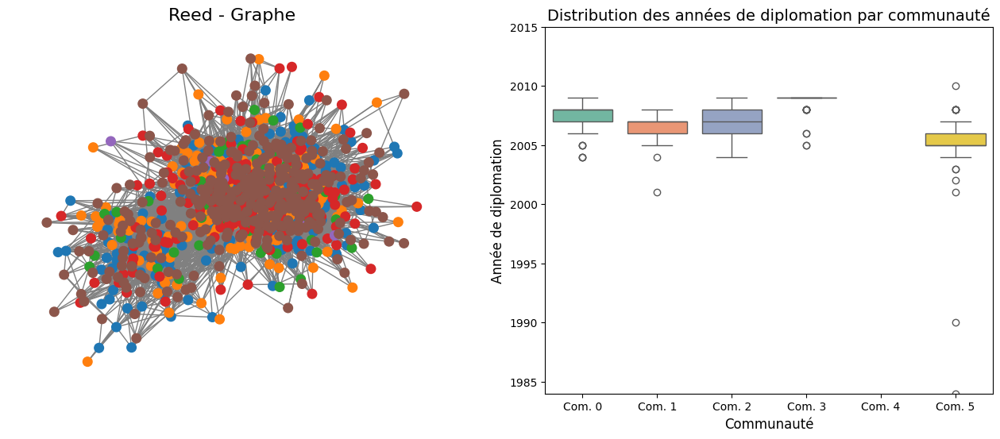

<Figure size 1000x600 with 0 Axes>

 22%|██▏       | 2/9 [00:15<00:56,  8.14s/it]


 Traitement du graphe Haverford76
Nombre de communautés: 6
Taille des communautés: (311, 287, 291, 201, 295, 29)


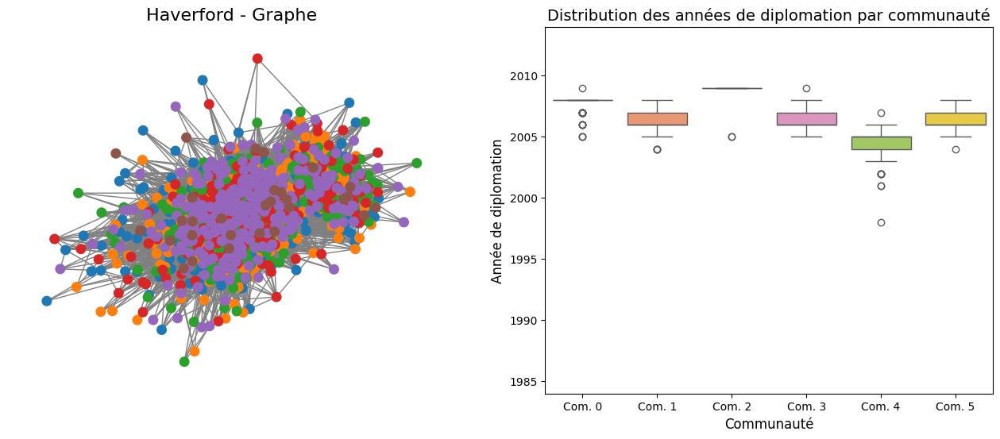

<Figure size 1000x600 with 0 Axes>

 33%|███▎      | 3/9 [00:35<01:21, 13.62s/it]


 Traitement du graphe Simmons81
Nombre de communautés: 6
Taille des communautés: (393, 300, 4, 25, 384, 333)


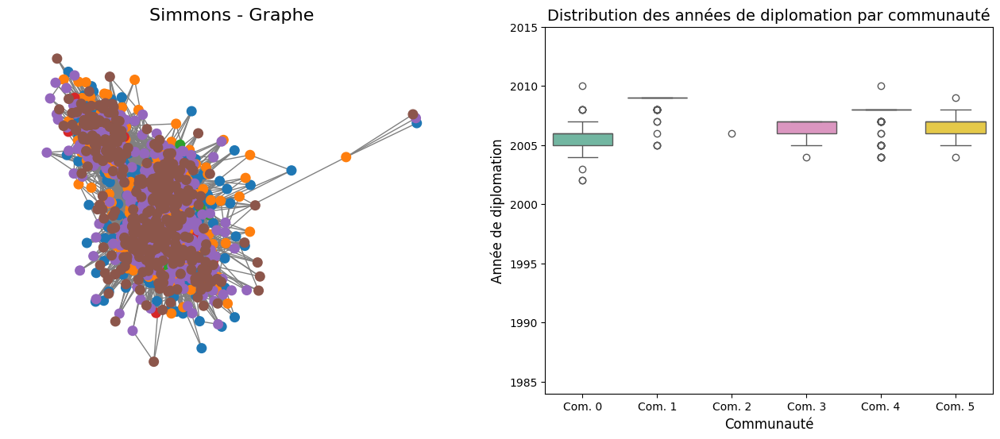

<Figure size 1000x600 with 0 Axes>

 44%|████▍     | 4/9 [00:58<01:26, 17.36s/it]


 Traitement du graphe Trinity100
Nombre de communautés: 6
Taille des communautés: (628, 476, 186, 492, 285, 484)


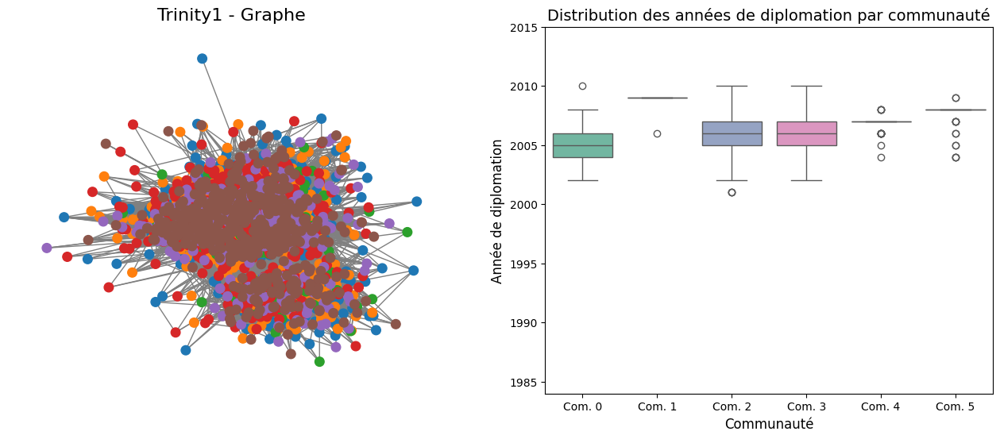

<Figure size 1000x600 with 0 Axes>

 56%|█████▌    | 5/9 [01:49<01:57, 29.43s/it]


 Traitement du graphe Maine59
Nombre de communautés: 9
Taille des communautés: (939, 278, 895, 2177, 1413, 1067, 1258, 194, 428)


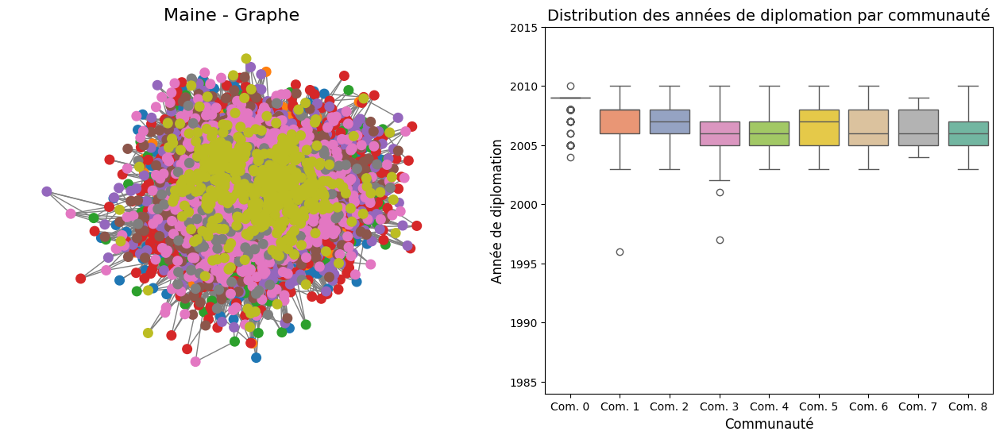

<Figure size 1000x600 with 0 Axes>

 67%|██████▋   | 6/9 [06:41<05:55, 118.61s/it]


 Traitement du graphe Bingham82
Nombre de communautés: 9
Taille des communautés: (1243, 1121, 789, 420, 1111, 806, 1233, 1458, 1489)


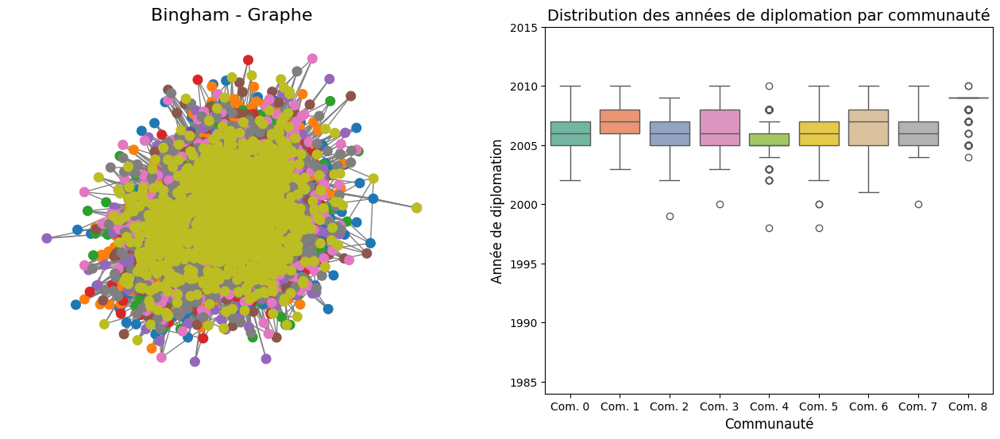

<Figure size 1000x600 with 0 Axes>

 78%|███████▊  | 7/9 [12:50<06:41, 200.63s/it]


 Traitement du graphe GWU54
Nombre de communautés: 11
Taille des communautés: (596, 80, 1602, 108, 235, 549, 815, 2173, 2248, 131, 3098)


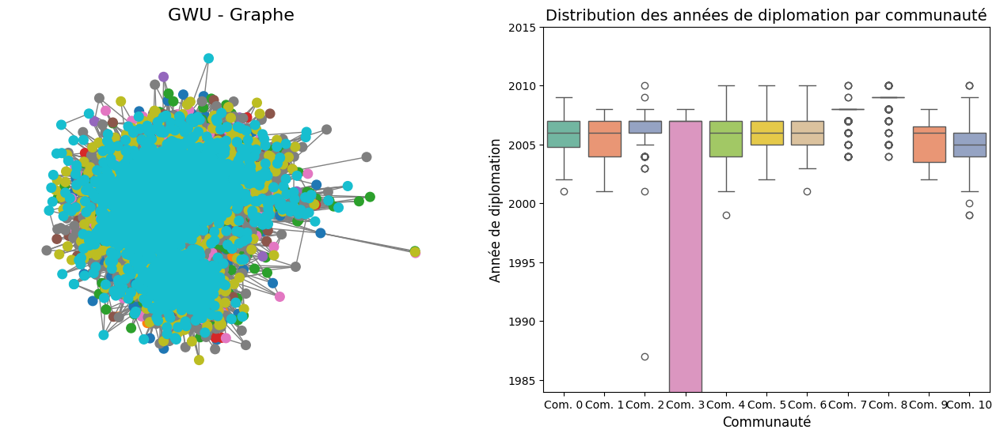

<Figure size 1000x600 with 0 Axes>

 89%|████████▉ | 8/9 [21:23<05:00, 300.01s/it]


 Traitement du graphe USF51
Nombre de communautés: 12
Taille des communautés: (171, 999, 1852, 1843, 401, 828, 452, 431, 493, 1900, 485, 2658)


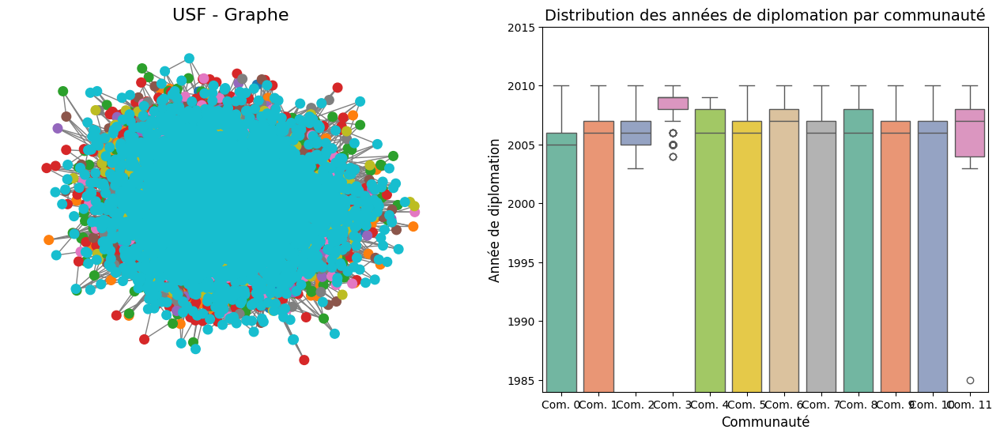

<Figure size 1000x600 with 0 Axes>

100%|██████████| 9/9 [30:37<00:00, 204.17s/it]


In [ ]:
for network_name in tqdm(['Caltech36', 'Reed98', 'Haverford76', 'Simmons81', 'Trinity100', 'Maine59', 'Bingham82', 'GWU54', 'USF51']) :
  louvain_plot_year_distribution(network_name, 3)

  0%|          | 0/9 [00:00<?, ?it/s]


 Traitement du graphe Caltech36
Nombre de communautés: 8
Taille des communautés: (106, 87, 63, 131, 76, 109, 100, 15)


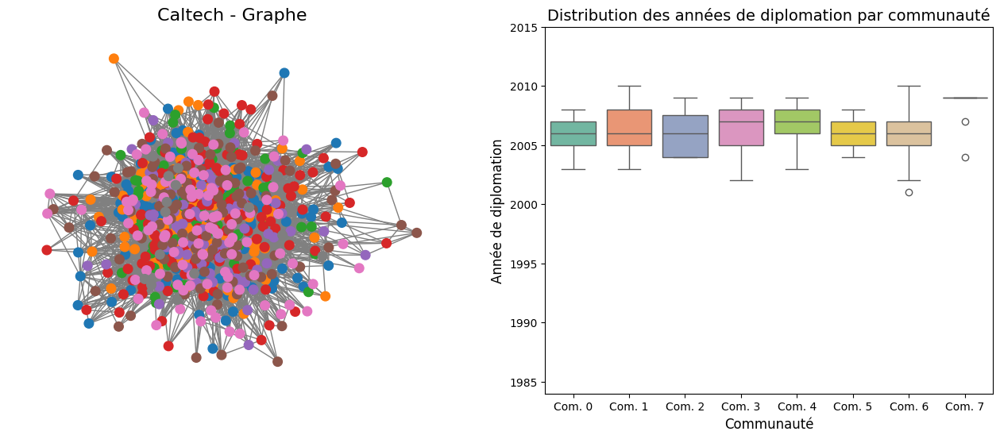

<Figure size 1000x600 with 0 Axes>

 11%|█         | 1/9 [00:06<00:48,  6.10s/it]


 Traitement du graphe Reed98
Nombre de communautés: 6
Taille des communautés: (154, 5, 240, 210, 63, 222)


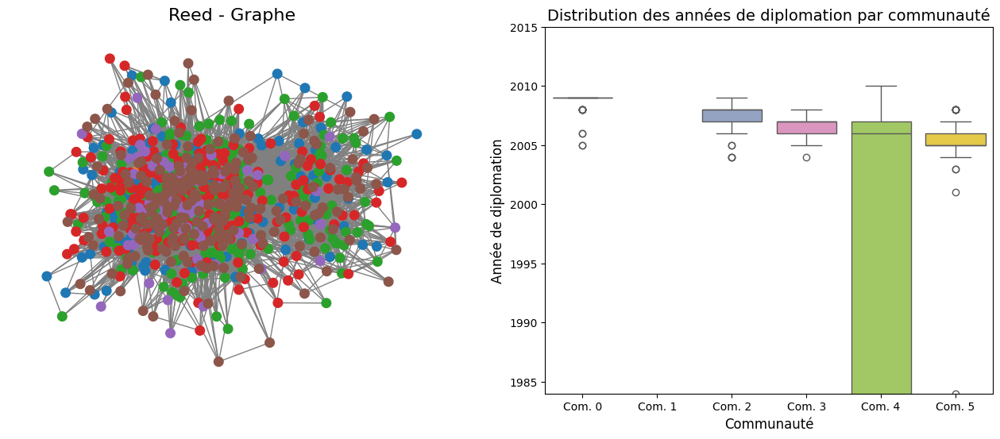

<Figure size 1000x600 with 0 Axes>

 22%|██▏       | 2/9 [00:15<00:57,  8.17s/it]


 Traitement du graphe Haverford76
Nombre de communautés: 6
Taille des communautés: (121, 164, 266, 210, 288, 360)


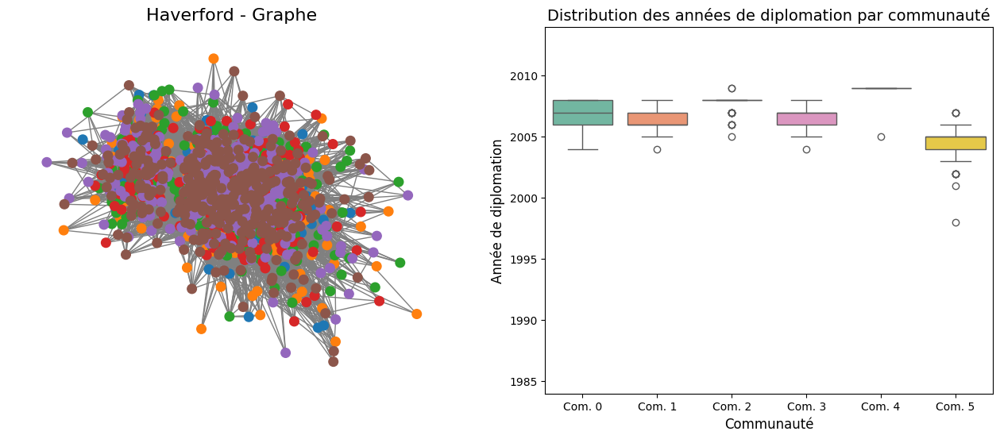

<Figure size 1000x600 with 0 Axes>

 33%|███▎      | 3/9 [00:35<01:20, 13.44s/it]


 Traitement du graphe Simmons81
Nombre de communautés: 6
Taille des communautés: (321, 296, 395, 9, 25, 370)


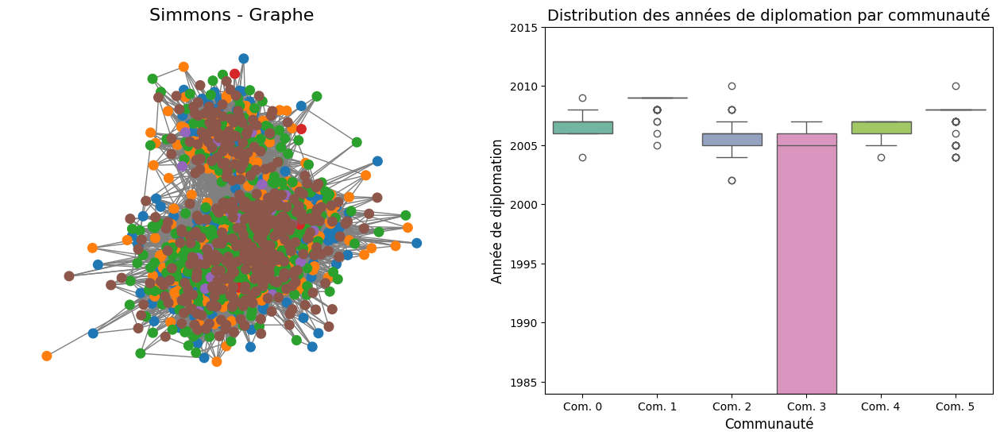

<Figure size 1000x600 with 0 Axes>

 44%|████▍     | 4/9 [00:52<01:15, 15.02s/it]


 Traitement du graphe Trinity100
Nombre de communautés: 5
Taille des communautés: (622, 475, 642, 314, 479)


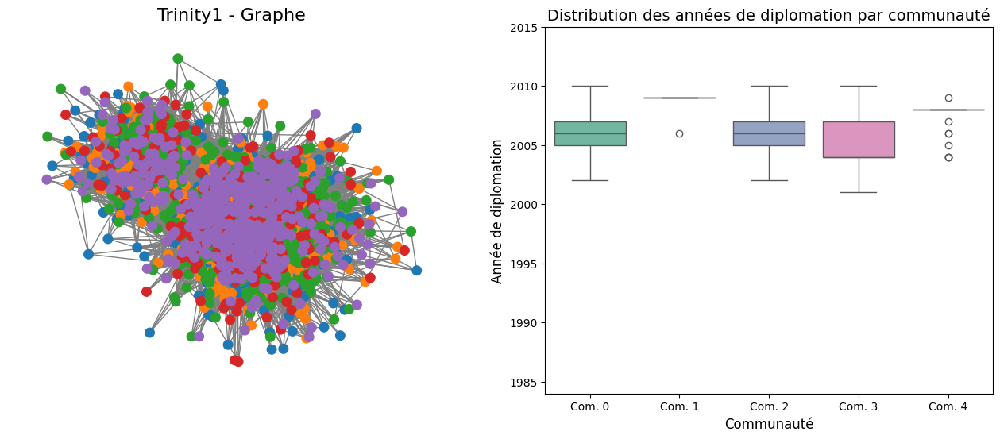

<Figure size 1000x600 with 0 Axes>

 56%|█████▌    | 5/9 [01:39<01:45, 26.35s/it]


 Traitement du graphe Maine59
Nombre de communautés: 10
Taille des communautés: (335, 22, 1939, 1180, 401, 1653, 692, 220, 1387, 678)


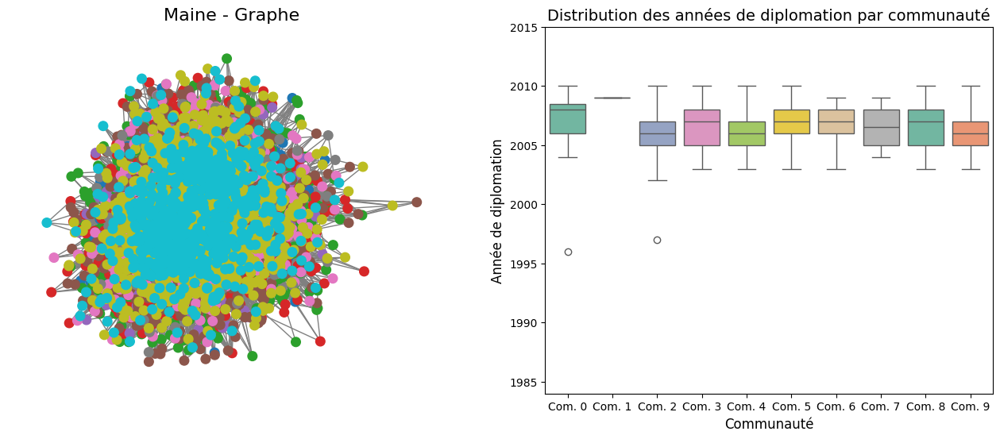

<Figure size 1000x600 with 0 Axes>

 67%|██████▋   | 6/9 [06:21<05:39, 113.32s/it]


 Traitement du graphe Bingham82
Nombre de communautés: 9
Taille des communautés: (1690, 256, 805, 2018, 437, 169, 1427, 1310, 1449)


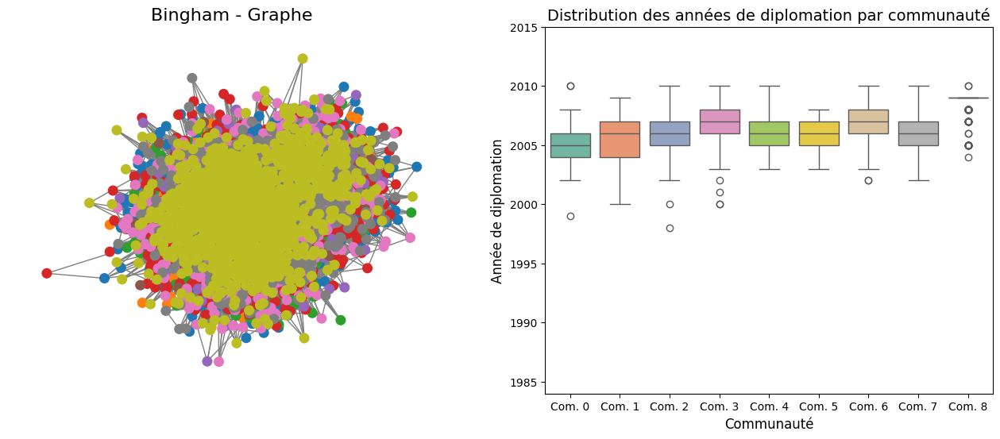

<Figure size 1000x600 with 0 Axes>

 78%|███████▊  | 7/9 [12:24<06:30, 195.05s/it]


 Traitement du graphe GWU54
Nombre de communautés: 10
Taille des communautés: (3046, 194, 165, 1694, 1109, 2204, 397, 156, 2219, 302)


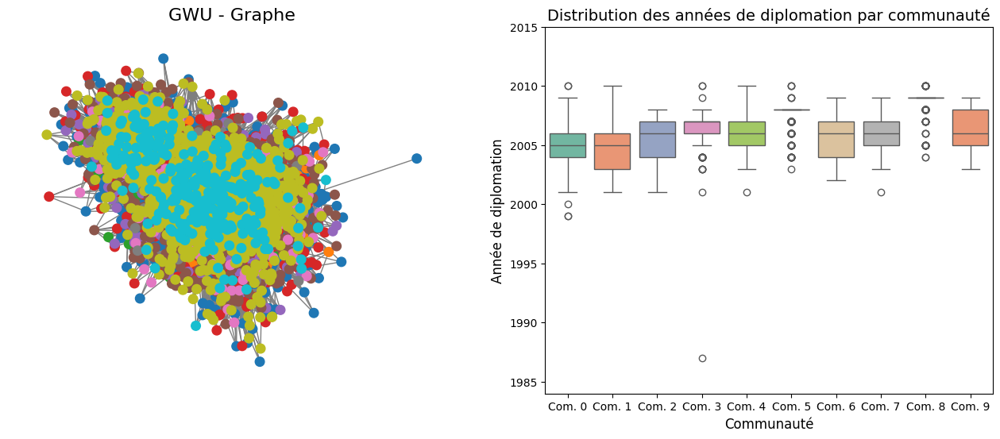

<Figure size 1000x600 with 0 Axes>

 89%|████████▉ | 8/9 [20:57<04:56, 296.05s/it]


 Traitement du graphe USF51
Nombre de communautés: 11
Taille des communautés: (435, 351, 1524, 1934, 437, 193, 2488, 441, 1970, 652, 1782)


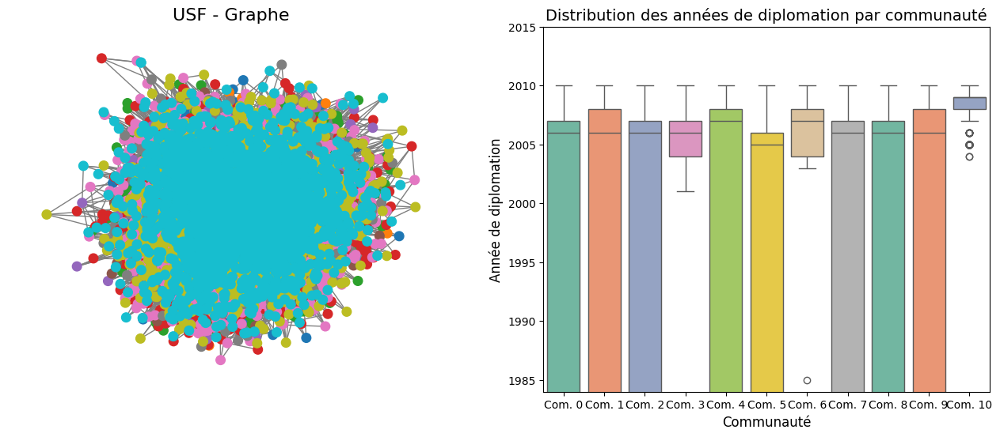

<Figure size 1000x600 with 0 Axes>

100%|██████████| 9/9 [29:55<00:00, 199.47s/it]


In [ ]:
for network_name in tqdm(['Caltech36', 'Reed98', 'Haverford76', 'Simmons81', 'Trinity100', 'Maine59', 'Bingham82', 'GWU54', 'USF51']) :
  louvain_plot_year_distribution(network_name, 4)

  0%|          | 0/9 [00:00<?, ?it/s]


 Traitement du graphe Caltech36
Nombre de communautés: 7
Taille des communautés: (110, 15, 100, 78, 62, 131, 179)


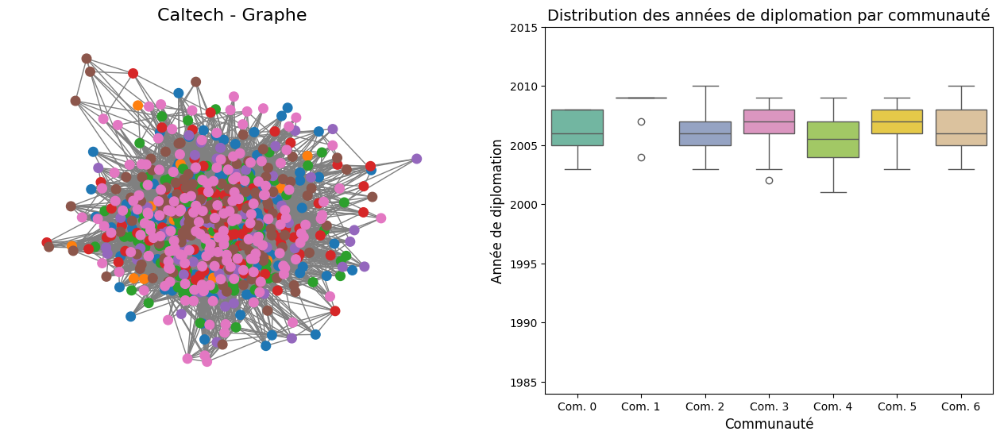

<Figure size 1000x600 with 0 Axes>

 11%|█         | 1/9 [00:07<01:01,  7.65s/it]


 Traitement du graphe Reed98
Nombre de communautés: 7
Taille des communautés: (247, 77, 146, 149, 5, 128, 128)


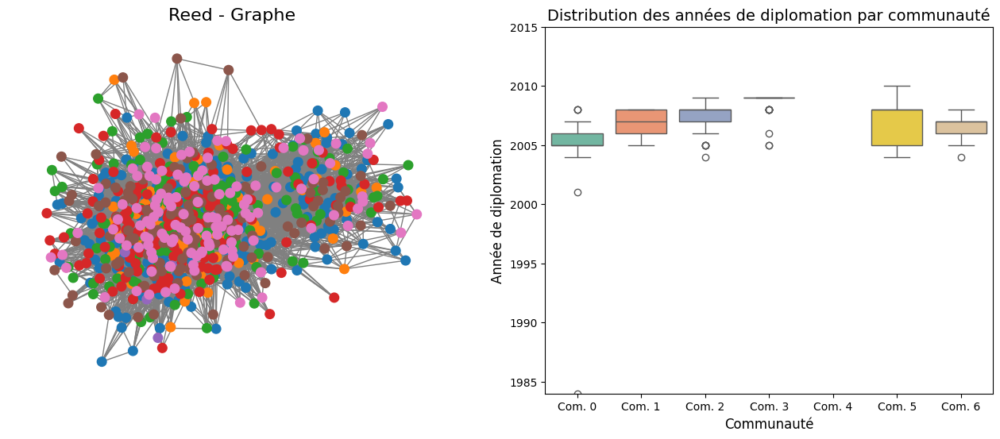

<Figure size 1000x600 with 0 Axes>

 22%|██▏       | 2/9 [00:15<00:54,  7.73s/it]


 Traitement du graphe Haverford76
Nombre de communautés: 5
Taille des communautés: (239, 316, 330, 289, 226)


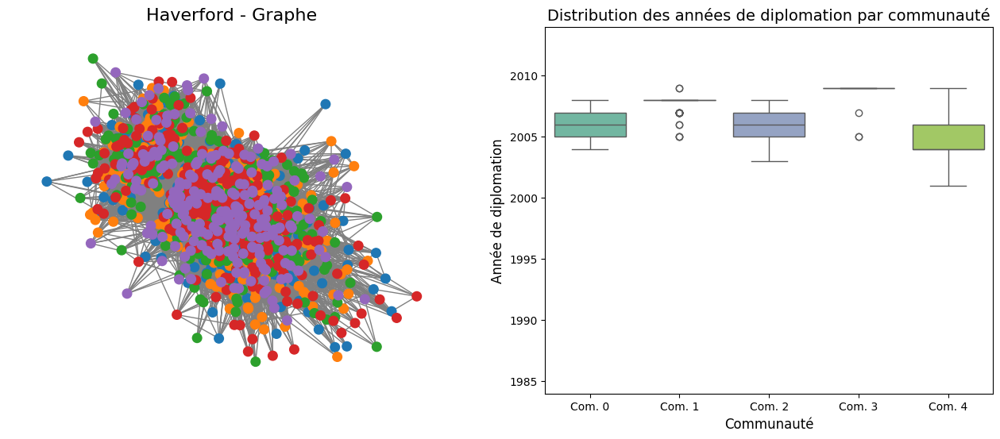

<Figure size 1000x600 with 0 Axes>

 33%|███▎      | 3/9 [00:36<01:21, 13.62s/it]


 Traitement du graphe Simmons81
Nombre de communautés: 5
Taille des communautés: (395, 324, 24, 365, 289)


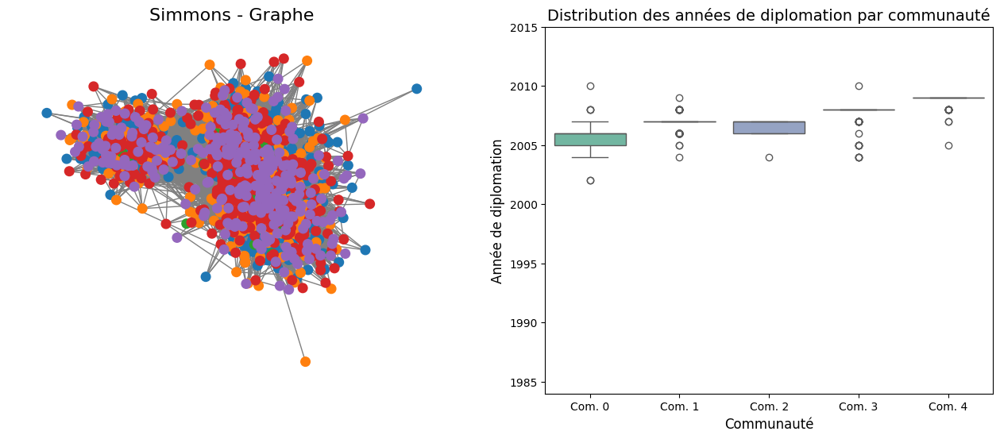

<Figure size 1000x600 with 0 Axes>

 44%|████▍     | 4/9 [00:52<01:14, 14.90s/it]


 Traitement du graphe Trinity100
Nombre de communautés: 5
Taille des communautés: (269, 627, 525, 624, 470)


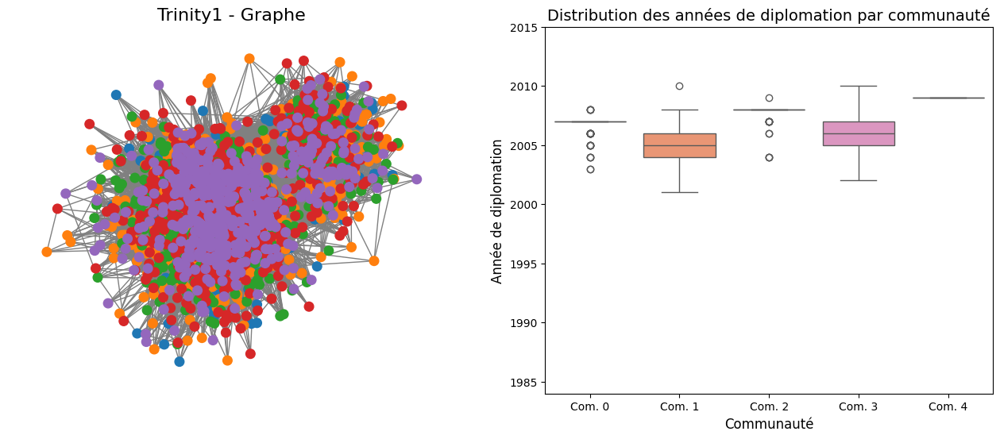

<Figure size 1000x600 with 0 Axes>

 56%|█████▌    | 5/9 [01:41<01:48, 27.00s/it]


 Traitement du graphe Maine59
Nombre de communautés: 8
Taille des communautés: (2441, 1051, 1204, 195, 394, 1383, 954, 757)


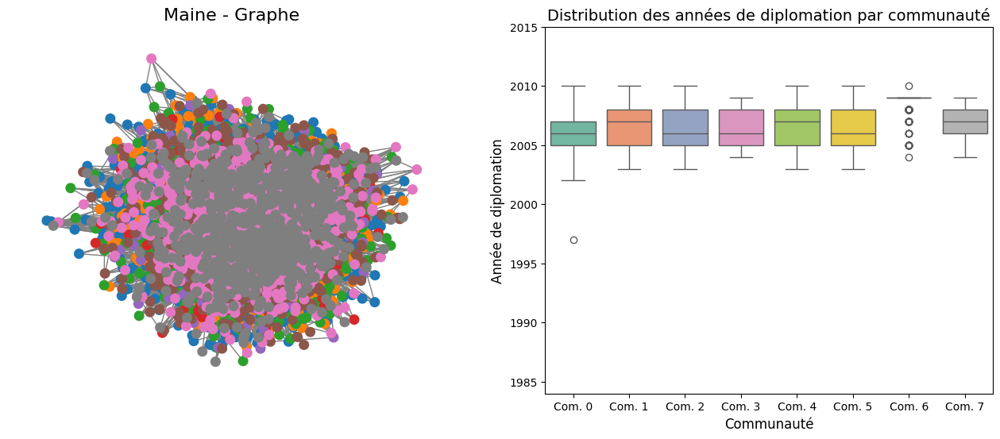

<Figure size 1000x600 with 0 Axes>

 67%|██████▋   | 6/9 [06:18<05:36, 112.16s/it]


 Traitement du graphe Bingham82
Nombre de communautés: 9
Taille des communautés: (765, 433, 1369, 1756, 968, 1158, 1336, 1428, 253)


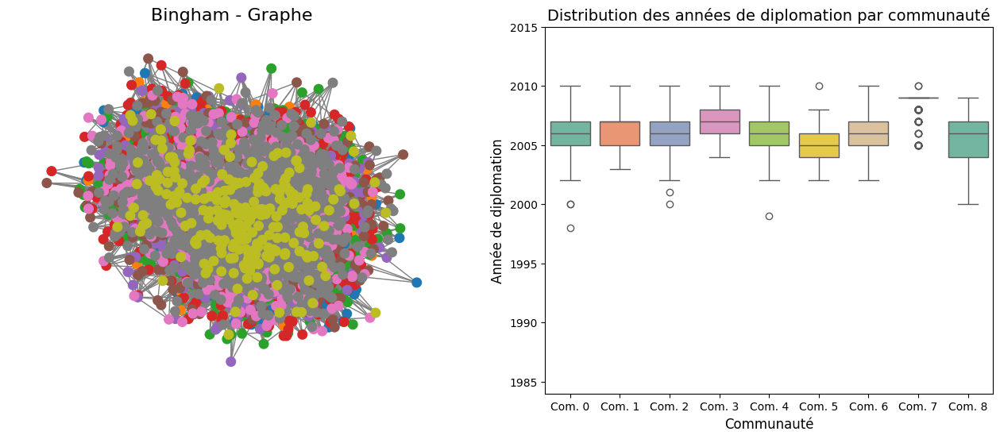

<Figure size 1000x600 with 0 Axes>

 78%|███████▊  | 7/9 [12:29<06:33, 196.69s/it]


 Traitement du graphe GWU54
Nombre de communautés: 10
Taille des communautés: (253, 2046, 401, 546, 2167, 1889, 239, 88, 2686, 1023)


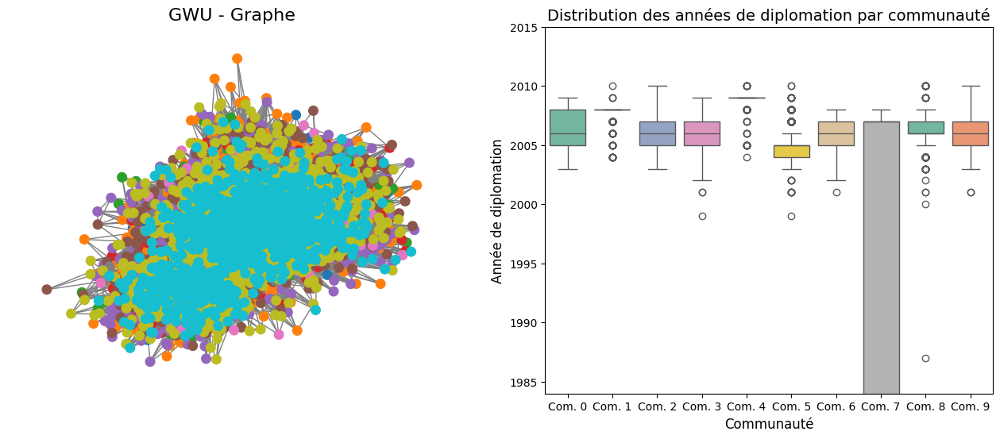

<Figure size 1000x600 with 0 Axes>

 89%|████████▉ | 8/9 [20:43<04:51, 291.34s/it]


 Traitement du graphe USF51
Nombre de communautés: 11
Taille des communautés: (770, 2095, 151, 960, 521, 1850, 414, 208, 1708, 484, 2733)


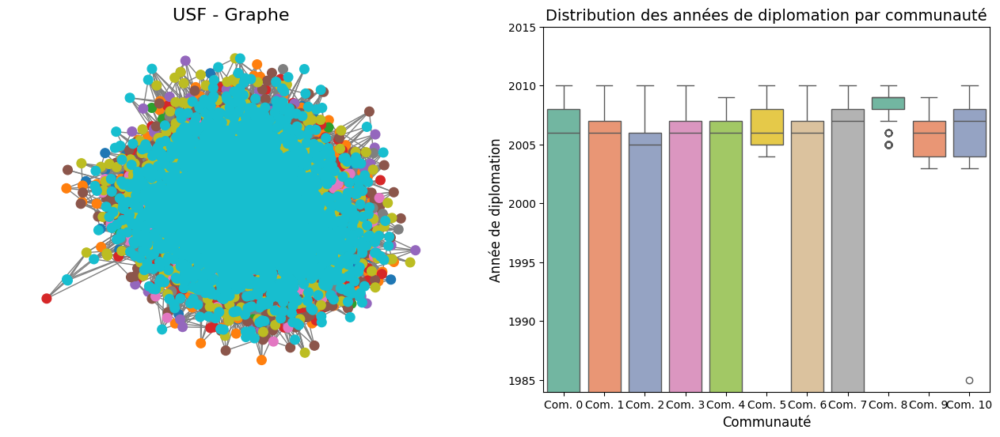

<Figure size 1000x600 with 0 Axes>

100%|██████████| 9/9 [29:11<00:00, 194.58s/it]


In [ ]:
for network_name in tqdm(['Caltech36', 'Reed98', 'Haverford76', 'Simmons81', 'Trinity100', 'Maine59', 'Bingham82', 'GWU54', 'USF51']) :
  louvain_plot_year_distribution(network_name, 5)

  0%|          | 0/9 [00:00<?, ?it/s]


 Traitement du graphe Caltech36
Nombre de communautés: 8
Taille des communautés: (116, 103, 92, 57, 15, 97, 77, 108)


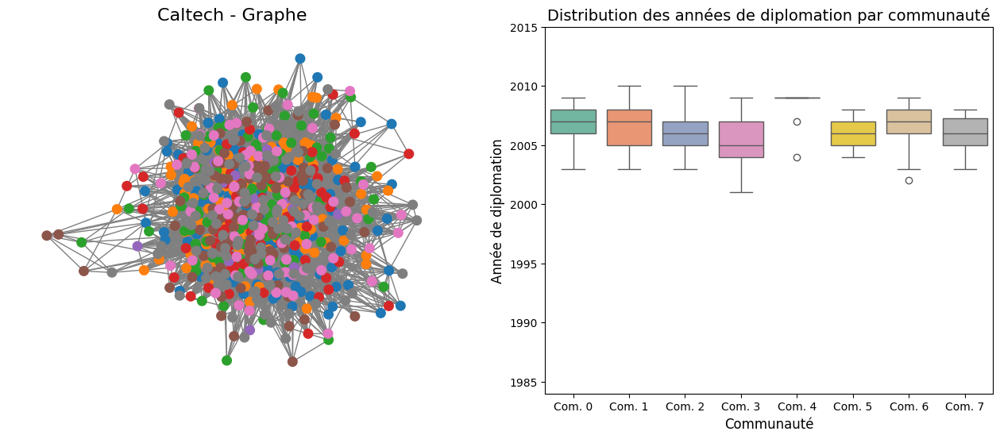

<Figure size 1000x600 with 0 Axes>

 11%|█         | 1/9 [00:07<00:58,  7.35s/it]


 Traitement du graphe Reed98
Nombre de communautés: 6
Taille des communautés: (52, 228, 87, 173, 179, 151)


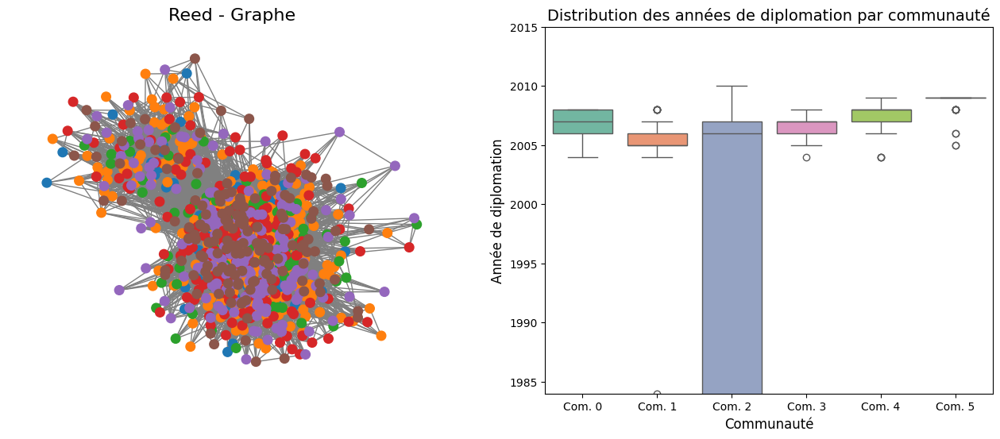

<Figure size 1000x600 with 0 Axes>

 22%|██▏       | 2/9 [00:15<00:52,  7.57s/it]


 Traitement du graphe Haverford76
Nombre de communautés: 5
Taille des communautés: (322, 288, 348, 340, 95)


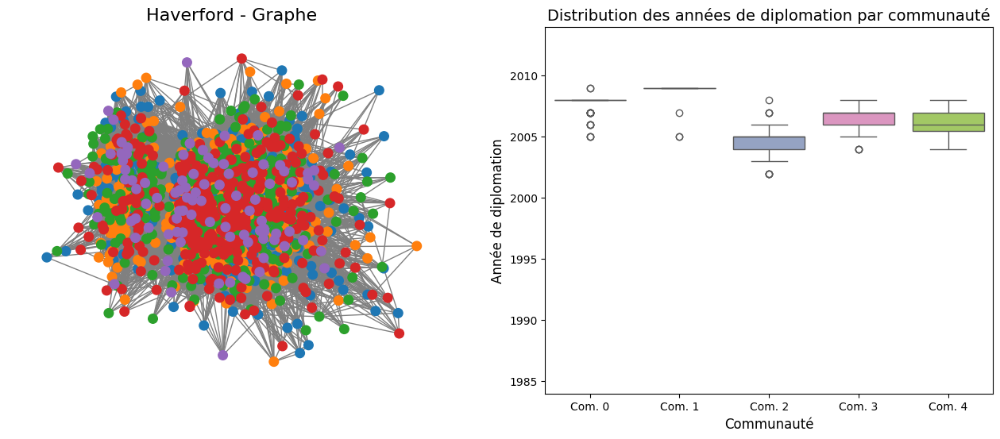

<Figure size 1000x600 with 0 Axes>

 33%|███▎      | 3/9 [00:38<01:28, 14.74s/it]


 Traitement du graphe Simmons81
Nombre de communautés: 4
Taille des communautés: (288, 29, 384, 677)


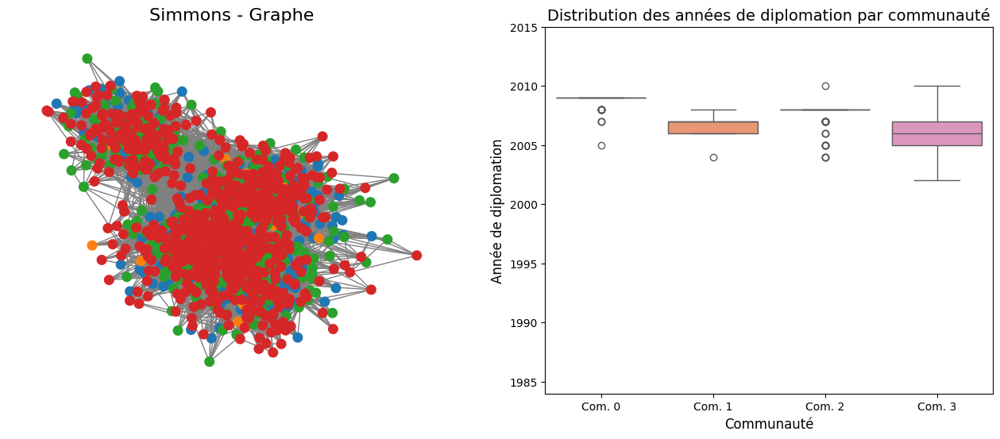

<Figure size 1000x600 with 0 Axes>

 44%|████▍     | 4/9 [00:53<01:15, 15.06s/it]


 Traitement du graphe Trinity100
Nombre de communautés: 5
Taille des communautés: (637, 465, 643, 626, 130)


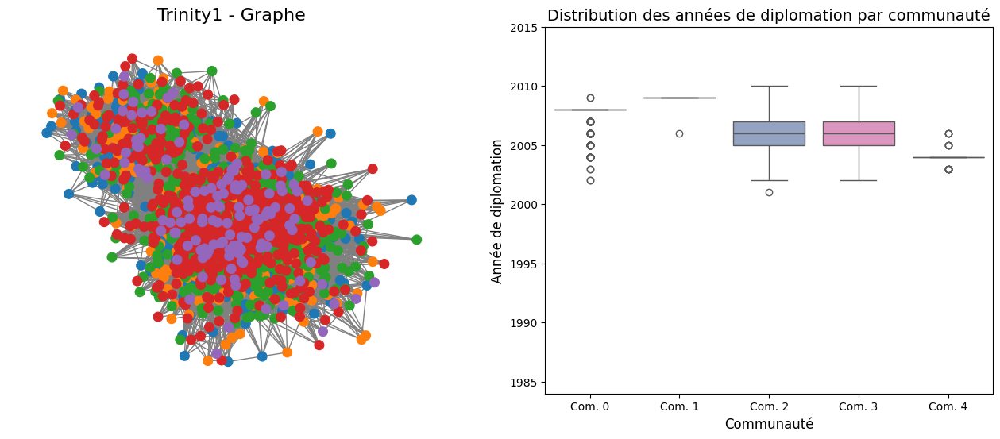

<Figure size 1000x600 with 0 Axes>

 56%|█████▌    | 5/9 [01:40<01:46, 26.50s/it]


 Traitement du graphe Maine59
Nombre de communautés: 9
Taille des communautés: (368, 198, 1398, 1339, 684, 469, 1025, 1028, 1744)


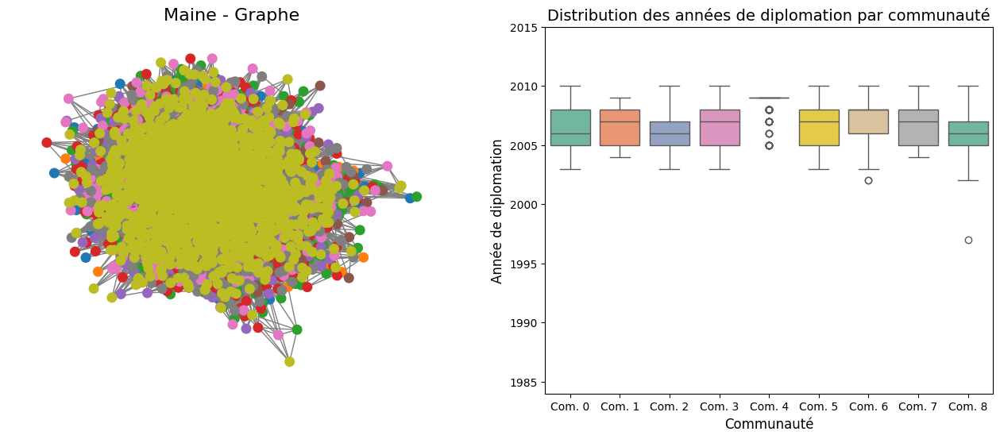

<Figure size 1000x600 with 0 Axes>

 67%|██████▋   | 6/9 [06:20<05:37, 112.46s/it]


 Traitement du graphe Bingham82
Nombre de communautés: 9
Taille des communautés: (380, 470, 782, 1171, 1405, 1616, 1217, 2138, 186)


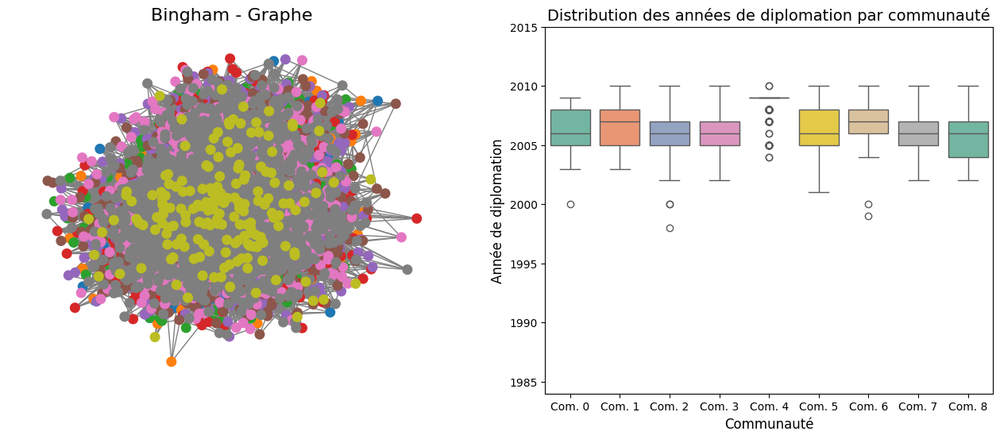

<Figure size 1000x600 with 0 Axes>

 78%|███████▊  | 7/9 [13:32<07:13, 216.96s/it]


 Traitement du graphe GWU54
Nombre de communautés: 9
Taille des communautés: (2215, 562, 401, 75, 2183, 1793, 231, 2168, 1575)


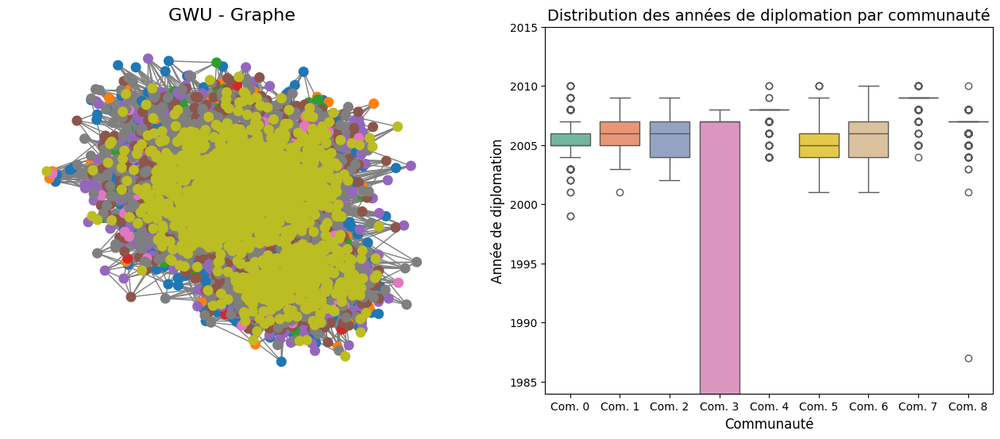

<Figure size 1000x600 with 0 Axes>

 89%|████████▉ | 8/9 [22:05<05:11, 311.44s/it]


 Traitement du graphe USF51
Nombre de communautés: 12
Taille des communautés: (1508, 1038, 1590, 663, 1852, 688, 2170, 467, 30, 445, 226, 972)


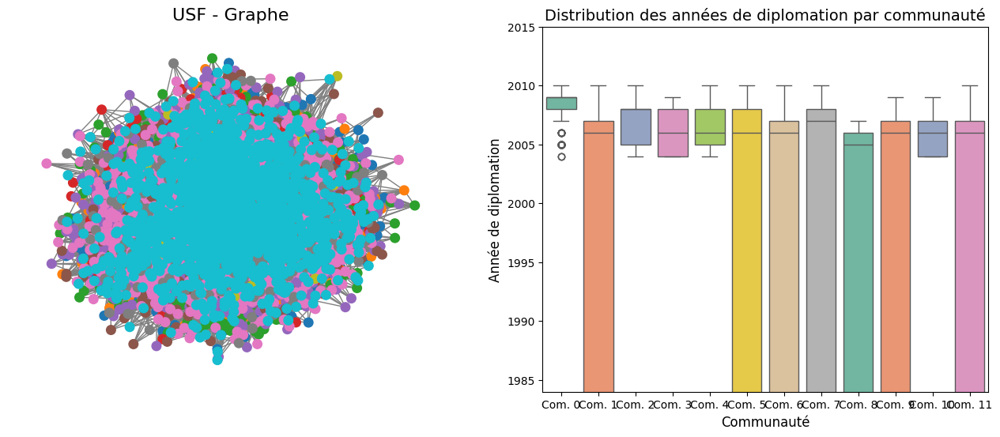

<Figure size 1000x600 with 0 Axes>

100%|██████████| 9/9 [30:26<00:00, 202.91s/it]


In [ ]:
for network_name in tqdm(['Caltech36', 'Reed98', 'Haverford76', 'Simmons81', 'Trinity100', 'Maine59', 'Bingham82', 'GWU54', 'USF51']) :
  louvain_plot_year_distribution(network_name, 6)


 Traitement du graphe Maine59
Nombre de communautés: 9
Taille des communautés: (368, 198, 1398, 1339, 684, 469, 1025, 1028, 1744)


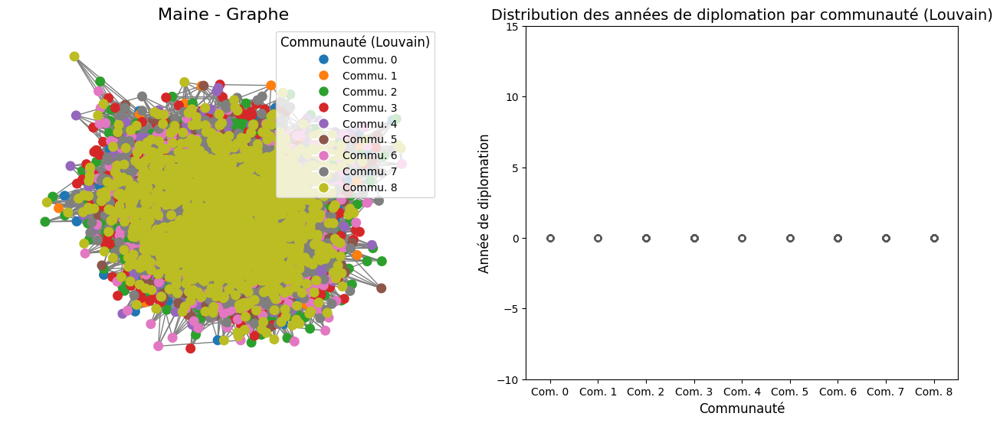

<Figure size 1000x600 with 0 Axes>

In [ ]:
louvain_plot_year_distribution('Maine59', 6)


 Traitement du graphe Caltech36
Nombre de communautés: 8
Taille des communautés: (116, 103, 92, 57, 15, 97, 77, 108)


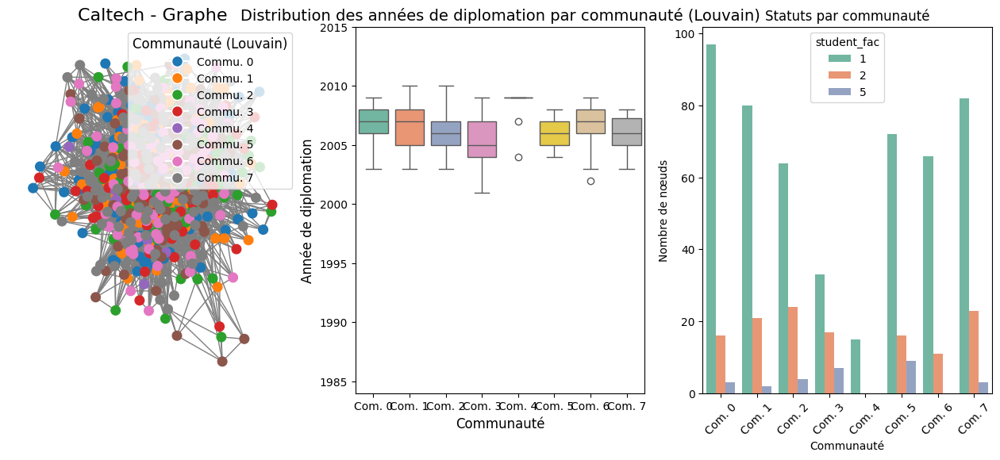

<Figure size 1000x600 with 0 Axes>

In [ ]:
louvain_plot_year_distribution('Caltech36', 6)